In [1]:
import scanpy as sc
#import session_info
import os
import anndata as ad
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
#import seaborn as sns
import math
#from plotnine import *
#import scvi
import os
#import celltypist
#import scanpy
# verbosity: errors (0), warnings (1), info (2), hints (3)
%matplotlib inline
sc.settings.verbosity = 0




In [2]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
#%matplotlib inline
sc.settings.figdir = "gudjonsson_celltype_figs"
sc.settings.set_figure_params(dpi_save=300, facecolor="white", frameon=False, figsize=(14,14))


# scRNA

In [3]:
import scanpy as sc
adata=sc.read_h5ad('/lustre/scratch124/cellgen/haniffa/projects/adult_skin_v1/nobackup_output//SpatialSkinAtlasMapping_scanviSpatialSkinAtlasMapping_TUTORIAL_HVGNUMBER5704__MAXEPOCHS10__BATCHKEYsample_id/adata_all_TUTORIAL+HVGNUMBER5704__MAXEPOCHS10__BATCHKEYsample_id.h5ad')

#adata=sc.read_h5ad('/nfs/team298/ls34/adult_skin/final_adatas/adata_combined_new.h5ad.final.filtered.scrna')

def remove_markers(LIST):
    try: 
        LIST = {key: [gene for gene in genes if gene in adata_5k.var_names] 
                           for key, genes in LIST.items()}
    except: 
        LIST =[gene for gene in LIST if gene in adata_5k.var_names]
    return LIST






In [4]:
adata=adata[adata.obs["Mapping_status"]=="TUTORIAL"].copy()
import gc
gc.collect()
adata.obs["Mapping_status"].value_counts()

Mapping_status
TUTORIAL    274834
Name: count, dtype: int64

In [5]:
PATH = '/nfs/team298/ls34/adult_skin/final_adatas/adata_combined_new.h5ad.final.filtered.nohealthy'
adata_5k=sc.read_h5ad(PATH)
adata_5k=adata_5k[adata_5k.obs["tech"]=="xenium"].copy()
import gc
gc.collect()

7519

In [6]:
{x:"" for x in adata.obs["sample_id"].unique()}

{'1': '',
 '2': '',
 '3': '',
 '4': '',
 '5': '',
 '6': '',
 '7': '',
 '8': '',
 '9': '',
 '10': '',
 '11': '',
 '12': '',
 '13': '',
 '14': '',
 '15': '',
 '16': '',
 '17': '',
 '18': '',
 '19': '',
 '20': '',
 '21': '',
 '22': '',
 '23': '',
 '24': '',
 '25': '',
 '26': '',
 '27': '',
 '28': '',
 '29': '',
 '30': '',
 '31': '',
 '32': '',
 '33': '',
 '34': '',
 '35': '',
 '36': '',
 '37': '',
 '38': '',
 '39': '',
 '40': '',
 '41': '',
 '42': '',
 '43': '',
 '44': '',
 '45': '',
 '46': '',
 '47': '',
 '48': '',
 '49': '',
 '50': '',
 '51': '',
 '52': '',
 '53': '',
 '54': '',
 '55': '',
 '56': '',
 '57': '',
 '58': '',
 '59': '',
 '60': '',
 '61': '',
 '62': '',
 '63': '',
 '64': '',
 '65': '',
 '66': '',
 '67': '',
 '68': '',
 '69': '',
 '70': '',
 '71': '',
 '72': '',
 '73': '',
 '74': '',
 '75': '',
 '76': '',
 '77': '',
 '78': '',
 '79': '',
 '80': '',
 '81': '',
 '82': '',
 '83': '',
 '84': '',
 '85': '',
 '86': '',
 '87': '',
 '88': '',
 '89': '',
 '90': '',
 '91': '',
 '92': '

# CHECK NORMALIZATION

In [7]:

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)



In [8]:
# sc.pp.normalize_total(adata_5k, target_sum=1e4)
# sc.pp.log1p(adata_5k)

In [9]:
{x:x for x in sorted(adata.obs["scanvi_predictions"].unique())}

{'ASIC2+_Mechanoreceptor': 'ASIC2+_Mechanoreceptor',
 'Adipocyte': 'Adipocyte',
 'Bcell': 'Bcell',
 'Cartilage': 'Cartilage',
 'Eosinophil': 'Eosinophil',
 'F1: Superficial': 'F1: Superficial',
 'F2/3: Perivascular': 'F2/3: Perivascular',
 'F2: Universal': 'F2: Universal',
 'F3: FRC-like': 'F3: FRC-like',
 'F4: DP_HHIP+': 'F4: DP_HHIP+',
 'F4: DS_DPEP1+': 'F4: DS_DPEP1+',
 'F4: TNN+COCH+': 'F4: TNN+COCH+',
 'F5: NGFR+': 'F5: NGFR+',
 'F5: RAMP1+': 'F5: RAMP1+',
 'F6: Inflammatory myofibroblast': 'F6: Inflammatory myofibroblast',
 'ILC1': 'ILC1',
 'ILC1_NCR2+P2RX7+': 'ILC1_NCR2+P2RX7+',
 'ILC2': 'ILC2',
 'ILC3': 'ILC3',
 'ILC3_CCL1+PTGDS+': 'ILC3_CCL1+PTGDS+',
 'ILC_Prolif': 'ILC_Prolif',
 'KC': 'KC',
 'KC1': 'KC1',
 'KC1-2_cycling': 'KC1-2_cycling',
 'KC2': 'KC2',
 'KC2/3_cycling': 'KC2/3_cycling',
 'KC3': 'KC3',
 'KC4': 'KC4',
 'KC5': 'KC5',
 'KC_HF: HFSC': 'KC_HF: HFSC',
 'KC_HF: HS': 'KC_HF: HS',
 'KC_HF: IRS1': 'KC_HF: IRS1',
 'KC_HF: Matrix': 'KC_HF: Matrix',
 'KC_HF: ORS0': 'KC_H

In [10]:
# CARTILAEG = MELANOCYTE
# SATWELLITE = mSchwann
# cdc2 = mmp12hi
# KCINFLAMMBASAL = BASAL

In [11]:
RENAME = {
 'Cartilage': 'Melanocyte',
     'Satellite cell': 'mSchwann',
 'cDC2: MMP12hi': 'cDC2',
 'KCinflamm_basal': 'KC1',
 'Tnaive_CD8': 'T',
    
     'ILC1_NCR2+P2RX7+': 'ILC1',
           'ILC3_CCL1+PTGDS+': 'ILC3',


    
    }
adata[adata.obs["scanvi_predictions"].isin(RENAME.keys())].obs.scanvi_predictions.value_counts()

scanvi_predictions
cDC2: MMP12hi       1018
Tnaive_CD8           800
KCinflamm_basal      440
ILC1_NCR2+P2RX7+      11
ILC3_CCL1+PTGDS+       3
Satellite cell         3
Cartilage              2
Name: count, dtype: int64

In [12]:



adata.obs["tmp"]=adata.obs["scanvi_predictions"].map(RENAME)
adata.obs["scanvi_predictions"]=adata.obs["scanvi_predictions"].map(RENAME).fillna(adata.obs["scanvi_predictions"])
adata.obs["scanvi_predictions"].nunique()

95

In [13]:
# PATH = '/nfs/team298/ls34/adult_skin/final_adatas/adata_combined_new.h5ad.final.filtered.nohealthy'
# adata_all=sc.read_h5ad(PATH)
# g_celltypes=list(adata.obs["scanvi_predictions"].unique())
# [x for x in adata_all.obs.lvl5_annotation.unique() if x not in g_celltypes]
# ['Cartilage',
#  'KCinflamm_basal',
#  'cDC2: MMP12hi',
#  'Tnaive_CD8',
#  'KC_HF: IRS0',
#  'ILC3_CCL1+PTGDS+',
#  'MigDC (cDC1)',
#  'ILC1_NCR2+P2RX7+',
#  'Mac2_CCL14hi',
#  'KC_HF: IRS_Cuticle','KC_HF: IRS0',
#  'Satellite cell',
#  'Skeletal muscle']

In [14]:
CATEGORY="lvl5_annotation"
adata.obs["lvl5_annotation"]=adata.obs["scanvi_predictions"]

try:
    adata.obs["lvl3_annotation_patient_status"] = adata.obs[CATEGORY].astype(str) + "__" +  adata.obs["Patient_status2"].astype(str)
    #CATEGORY="lvl3_annotation_patient_status"
    adata.obs["lvl3_annotation_patient_status"].value_counts()
except:
    1

In [15]:
adata.obs["info_id6"]=adata.obs["sample_id"]


In [16]:

RENAME = {'ASIC2+_Mechanoreceptor': 'Other',
 'Adipocyte': 'Other',
 'Bcell': 'Other',
 'Cartilage': 'Other',
 'F1: Superficial': 'Fibroblast',
 'F2/3: Perivascular': 'Fibroblast', 
 'F2: Universal': 'Fibroblast',
 'F3: FRC-like':  'Fibroblast',
 'F4: DP_HHIP+':  'Fibroblast',
 'F4: DS_DPEP1+':  'Fibroblast',
 'F4: TNN+COCH+':  'Fibroblast',
 'F5: NGFR+':  'Fibroblast',
 'F5: RAMP1+':  'Fibroblast',
 'F6: Inflammatory myofibroblast': 'Fibroblast',
 'ILC1': 'ILC',
 'ILC2': 'ILC',
 'ILC3': 'ILC',
 'ILC3_CCL1+PTGDS+': 'ILC',
 'ILC_Prolif': 'ILC',
 'KC': 'KC',
 'KC1': 'KC',
 'KC1-2_cycling': 'KC',
 'KC2': 'KC',
 'KC2/3_cycling': 'KC',
 'KC3': 'KC',
 'KC4': 'KC',
 'KC5': 'KC',
 'KC_HF: HFSC': 'KC_HF',
 'KC_HF: HS': 'KC_HF',
 'KC_HF: IRS1':'KC_HF',
 'KC_HF: Matrix':'KC_HF',
 'KC_HF: ORS0':'KC_HF',
 'KC_HF: ORS1': 'KC_HF',
 'KC_HF: ORS2':'KC_HF',
 'KC_HF: ORS_junction': 'KC_HF',
 'KC_HF: SPON2+': 'KC_HF',
 'KC_Sebocyte_DuctInner': 'KC_HF',
 'KC_Sebocyte_DuctInner_Junction':'KC_HF',
 'KC_Sebocyte_DuctOuter': 'KC_HF',
 'KC_Sebocyte_GlandBasal': 'KC_HF',
 'KC_Sebocyte_GlandInner': 'KC_HF',
 'KCinflamm_basal': 'KC',
 'KCinflamm_int/late': 'KC',
 'LC': 'Myeloid',
 'LE': "Endothelium/pericyte/muscle",
 'Mac1': 'Myeloid',
 'Mac2': 'Myeloid',
 'Mac2_CCL14hi':  'Myeloid',
 'Mac_CX3CR1+':  'Myeloid',
 'Mac_TREM2+LPL+': 'Myeloid',
 'Mast cell': 'Myeloid',
 'Melanocyte': 'Other',
 'MigDC (cDC1)': 'Myeloid',
 'MigDC (cDC2)':  'Myeloid',
 'MoDC': 'Myeloid',
 'Monocyte': 'Myeloid',
 'NK': 'ILC',
 'Neutrophil': 'Myeloid',
 'Pericyte1': "Endothelium/pericyte/muscle",
 'Pericyte2_VSMC': "Endothelium/pericyte/muscle",
 'Plasma cell': 'Other',
 'Satellite cell': 'Other',
 'Smooth muscle': "Endothelium/pericyte/muscle",
 'Sweat gland': 'Sweat gland',
 'Sweat gland Myoepithelial': 'Sweat gland',
 'Sweat gland channel inner':'Sweat gland',
 'Sweat gland channel outer': 'Sweat gland',
 'T': 'T',
 'TR1': 'T',
 'TRM_IL13+': 'T',
 'TRM_IL17+': 'T',
 'T_Prolif': 'T',
 'T_γδ': 'T',
 'Tc0': 'T',
 'Tc1': 'T',
 'Tc2': 'T',
 'Tc3_IFNGhi': 'T',
 'Tc_Prolif': 'T',
 'Th': 'T',
 'Th/TRM prolif': 'T',
 'Th_PPARGhi': 'T',
 'Tnaive': 'T',
 'TransitionalDC': 'Myeloid',
 'Treg': 'T',
 'Treg/Tnaive_prolif': 'T',
 'Treg_LRRC32+': 'T',
 'VE1_Art': "Endothelium/pericyte/muscle",
 'VE2':"Endothelium/pericyte/muscle",
 'VE3_Ven': "Endothelium/pericyte/muscle",
 'VE3_Ven_APLN+': "Endothelium/pericyte/muscle",
 'VE4_Cap': "Endothelium/pericyte/muscle",
 'cDC':  'Myeloid',
 'cDC1':  'Myeloid',
 'cDC2':  'Myeloid',
 'cDC2: EREG+CCR7+':  'Myeloid',
 'cDC2: MMP12hi': 'Myeloid',
 'cDC2_cycling': 'Myeloid',
 'mSchwann': 'Schwann',
 'nmSchwann': 'Schwann',
 'pDC': 'Myeloid',
          'Eosinophil': 'Myeloid',
 'ILC1_NCR2+P2RX7+': 'ILC',
          
 'KC_HF: IRS_Cuticle': 'KC_HF',
 'Merkel cell': 'Other',
 'Skeletal muscle': "Endothelium/pericyte/muscle",
 'Tnaive_CD8': 'T'
    }

{x:x for x in sorted(adata.obs["lvl5_annotation"].unique()) if x not in RENAME.keys()}




{}

In [17]:
adata.obs["lvl1_new"]=adata.obs["lvl5_annotation"].map(RENAME)
adata.obs["lvl0"]=adata.obs["lvl5_annotation"].map(RENAME)
adata.obs["lvl1_new"].value_counts()

lvl1_new
KC                             97277
Fibroblast                     70306
Endothelium/pericyte/muscle    41481
T                              27879
Myeloid                        15555
KC_HF                           8076
Other                           6383
Sweat gland                     3690
Schwann                         3151
ILC                             1036
Name: count, dtype: int64

In [18]:
import gc
gc.collect()

92

# T cells

In [19]:
adata_i = adata[#(adata.obs["lvl1_new"].str.startswith("T"))
              (adata.obs["lvl5_annotation"].str.startswith("T"))|
    (adata.obs["lvl5_annotation"].str.startswith("ILC"))|
    (adata.obs["lvl5_annotation"].str.startswith("NK"))
               ]
adata_i = adata_i[~(adata_i.obs["lvl5_annotation"].str.startswith("Tran"))]

adata_i.obs[CATEGORY].value_counts()

lvl5_annotation
Th                    10936
Th_PPARGhi             3496
Treg_LRRC32+           2151
Tc3_IFNGhi             2114
Treg                   2090
T                      1982
Tnaive                 1502
T_γδ                   1349
Tc2                    1246
Tc1                     587
ILC3                    572
ILC1                    262
NK                      178
TRM_IL13+               149
Tc0                      90
TRM_IL17+                59
TR1                      51
T_Prolif                 29
Th/TRM prolif            29
ILC2                     20
Treg/Tnaive_prolif       15
Tc_Prolif                 4
ILC_Prolif                4
Name: count, dtype: int64

In [20]:
import pickle

file_path = "/nfs/team298/ls34/color_for_adult_skin2.pkl"

with open(file_path, "rb") as f:
    colors = pickle.load(f)



In [21]:
NEIGHBOR=20
latent_key = "neighbor_20"
sc.pp.neighbors(adata_i, use_rep = 'X_scanvi', metric = "euclidean", n_neighbors=NEIGHBOR,key_added=f"neighbor_{NEIGHBOR}")
sc.tl.umap(adata_i, min_dist=0.1, neighbors_key =f"neighbor_{NEIGHBOR}" )
# sc.tl.leiden(adata, resolution=2, key_added="latent_leiden2", #neighbors_key= latent_key 
#              )

/software/cellgen/team298/ls34/ccc_liana/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


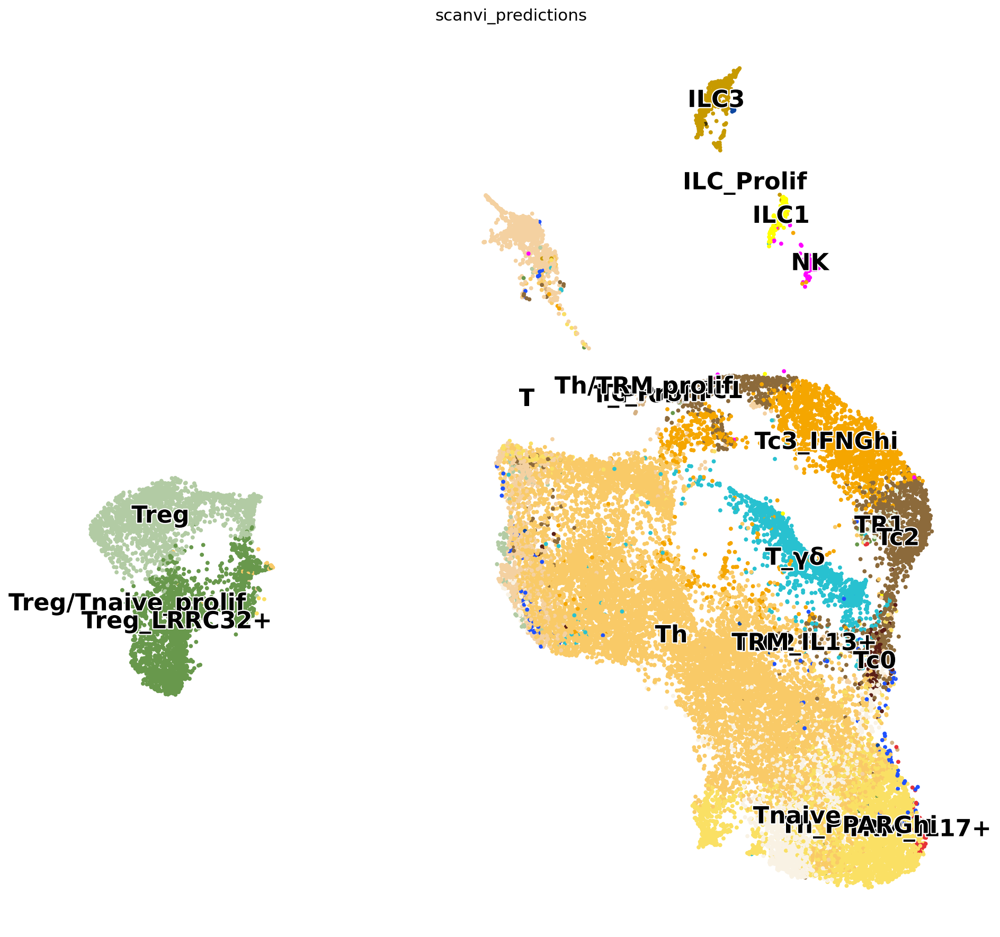

In [22]:
sc.pl.umap(
        adata_i,
        color=["scanvi_predictions"],
        legend_loc="on data",
        s=50,
        legend_fontsize=20,
        legend_fontoutline=2,
        show=True,
   palette=colors,
    #title=MODEL,
    save="Tumap.pdf"
   # groups="Plasma cell",
#     linewidth=0.1,
#     edgecolor='grey',
    
  #   palette=["#F2F2F2",   "#87CEEB",    ],

    )


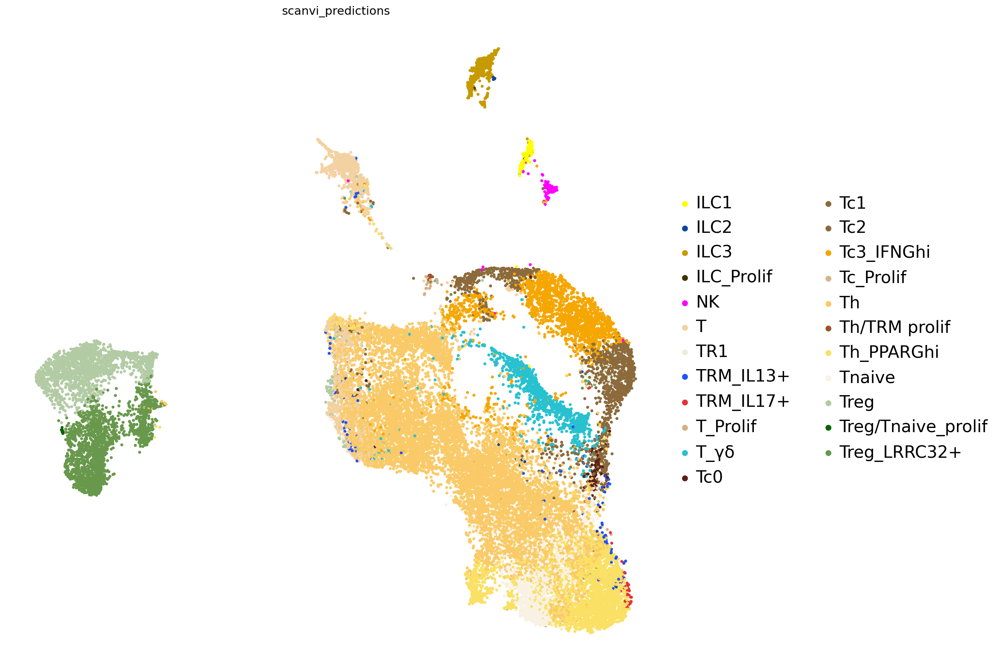

In [23]:
sc.pl.umap(
        adata_i,
        color=["scanvi_predictions"],
        #legend_loc="on data",
        s=50,
        legend_fontsize=20,
        legend_fontoutline=2,
        show=True,
   palette=colors,
    #title=MODEL,
    save="Tumap_legend.pdf"
   # groups="Plasma cell",
#     linewidth=0.1,
#     edgecolor='grey',
    
  #   palette=["#F2F2F2",   "#87CEEB",    ],

    )


In [24]:
# adata_5k.obs.lvl0.value_counts()

In [25]:
# adata_5k_i = adata_5k[(adata_5k.obs["lvl1_new"].str.startswith("T"))|
#                       (adata_5k.obs["lvl1_new"].str.startswith("ILC"))
#                     # (adata_5k.obs[CATEGORY].str.startswith("Plasm"))|
#                     #    (adata_5k.obs[CATEGORY].str.startswith("Bcell"))
#                      ]
# adata_5k_i.obs[CATEGORY].value_counts()


In [26]:
desired_order = [ 'Treg',"Treg_LRRC32",'Treg_LRRC32+',
                  'Tr1','TR1','T_lowq maybe',
                'Tnaive','Tnaive_CD8',
                  'Tnaive/Tcm','Tnaive/Tcm,1','Tnaive/Tcm,0','Tnaive (blood)','TRM/Tnaive',
    
                 'T_CD4_naive','Th_MCAMhi_PTGS2+', 
                  'Th','Th_MCAMhi',
                 'Th_CXCR6+',
                 'Th_PPARGhi',
                 'Tc0',
                 'Tc0_IL9R+_GPR15hi',"Tc_IL9R+GPR15hi",'Tc_GPR15hi',
               'Tc_naive','Tc1',
                  'Tc','Tc2','Tc_IFNGhi1',
                  'Tc_IFNGhi','Tc1_IFNGhi', 'Tc_IFNGhi2', 'Tc2_IFNGhi',
                 'Tc3_IFNGhi',
                 
                 
                 'TRM_IL13+',
'TRM_IL17+_Cytotoxic',                 'TRM_IL17+_other',


                  'Tc_IL13','TRM_IL22_2','TRM_IL22','T*RM*_IL22','TRM_IL13',
                  'Tc_IL17','TRM_IL17+mixed','TRM_IL17+','TRM_IL17','TRM_IL17lo','T_ITGA1hi',
'TRM',
 'Tc_gamma_delta','Tc_ZNF683+/γδ', "T_γδ",  'TRM_ZNF683+', 'Tc_ZNF683+','TRM_ZNF683+ITGA1+',
  'T',
 'NK',

 'ILC1_NK','ILC1_NK_cycling',
                 'ILC1','ILC1_NCR2+P2RX7+',



'ILC3',
    'ILC1_3','ILC1_3_cycling',    'ILC1_3_CCL1hi_cycling','ILC3_CCL1+PTGDS+',  'ILC_Prolif',
 
'ILC2',



'T_Prolif',


'Eosinophils', 
'Eosinophil',"missing",
                 "Treg/Tnaive_prolif",
                 'Th/TRM prolif','TRM_Prolif',
'Treg_prolif',

'Tc_Prolif',
               
                 










                 


 ]


# ORDER_T2=desired_order
# # Ensure 'lvl3_annotation' is categorical
# if not pd.api.types.is_categorical_dtype(adata_5k_i.obs[CATEGORY]):
#     adata_5k_i.obs[CATEGORY] = adata_5k_i.obs[CATEGORY].astype('category')

# missing_data = 0
# for x in list(adata_5k_i.obs[CATEGORY].unique()):
#     if x not in desired_order:
#         print(x)
#         missing_data +=1
# if missing_data != 0:
#     stop
        

# # Set the categories in the desired order
# adata_5k_i.obs[CATEGORY] = pd.Categorical(
#     adata_5k_i.obs[CATEGORY],
#     categories=desired_order,
#     ordered=True
# )


In [27]:

ORDER_T=desired_order


# Ensure 'lvl3_annotation' is categorical
if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):
    adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].astype('category')

missing_data = 0
for x in list(adata_i.obs[CATEGORY].unique()):
    if x not in desired_order:
        print(x)
        missing_data +=1
if missing_data != 0:
    stop
        

# Set the categories in the desired order
adata_i.obs[CATEGORY] = pd.Categorical(
    adata_i.obs[CATEGORY],
    categories=desired_order,
    ordered=True
)


/tmp/ipykernel_3798992/370554533.py:5: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):


In [28]:
ALL_T = {'Conventional': ['CD3D', "CD4", "CD8A"],
 'Treg': ['FOXP3', 'TIGIT', 'CTLA4', 'IL2RA'],
 'Activated_Treg': ['LRRC32',
  'IL1R1',
  'IL1R2',
 # 'CMSS1',
  'LAYN',
  'CCR8',
  'NR4A1'],
 'TR1': ['EOMES',
  'IL10',
  'LAG3',
  'HAVCR2',
  'PDCD1',
  'FOXB1',
  'TNFSF9',
 # 'VCAM1'
        ],
  
 'Naive/Tcm': ['SELL', 'CCR7', 'S1PR1', 'TCF7', 'PAK2', 'ICAM2', 'PASK', ],
 'GIMAPs': ['GIMAP1', 'GIMAP4', 'GIMAP5', 'GIMAP7'],
 'Th': ['CD4', 'CD40LG', 'MCAM', ],
 'Th_PPARGhi': ['PPARG', 'BTD', 'KIF13B', 'DGKH', 'RORA-AS1','SPAG1',
         'XYLT1', 'GNAQ',  'ZEB2', # 'PTGS2', 'MMP7',
        "ZHX2",'CCR6', 'BACH2', "CXCR6",
               ],
         #"CD8": ["CD8A"],
        
                
 'CD8A+ cytotoxic T cells': [ 'GZMA', 'GZMK', 'CCL4','NKG7', 'CCL5',  ],
           'Tc0': ['DONSON', 'GPR15', 'CD8B2', 'IL9R', 
                     #"AGAP1", "C12orf42", "GML", "CCR5",
                     ],

         'IFNG': ["KLRG1",'IFNG', 'TNFSF9', 'CCL3'],
 'Tissue-residency\n markers': ['CD8A', 'ITGAE', 'CD109', 'ZNF683', 'ENTPD1'],
 'TRM_IL13': ['IL22', 'IL13', 'NBAS',# 'CCL17',
         'AREG', 'IL9R', 'PDLIM4', 'CCR8',
         'ZBTB16', 'KLRC4', 'ADGRG1', 'RGS9'],
 'TRM_IL17': ['IL17A',
  'IL17F',
  'CXCL13',
  'CCL20',
  'IL23R',
  'RORC',
  'ADAM12',  'LRRN3',
  'MYO7A',
  'IL21',],
    'Mixed': [

  'CTSH',
  'VDR',
  'CCR6',
  'IL26'
         ],
 'Other': ['PTPN13', #'ITGA1'
          ],
 'ITGA1hi': ['ITGA1', 'ZHX2', 'BICD1', 'PRR5L', 'ST8SIA1', 'ZNF407', "KLRG1"],
 #'Memory': ['CD69'],
 'Gamma-delta': ['FXYD2',
  'TRGC2',
  'TRDV1',
  'TRGV4',
  'EMP1',
  'NSG1',
  'MPZL2',
  'XCL1',
  'KLRC2',
  'KLRC3',
  'KLRD1',
  'TRDC',
  'VSTM2L',
  'LAT2',
  'SPINT2',
  'KRT86',
  'FCER1G',
  'TRDV1',
  'SPRY2'],
 'Innate': [#'KLRC2', 'KLRC3', 'KLRB1', 'KIT', 'KLRC1',
     'TYROBP',],
 #'ILC2': ['GATA3', 'PTGDR2', 'TNFRSF25'],
                 'Cycling': ['UBE2C', 'MKI67', 'TOP2A'],
        # "tfh": ['IL21', "CXCL13", "ICOS", 'CXCR5', 'PDCD1', 'BCL6', 
           

 # 'ILC2_inflammatory': ['CRLF2',
 #  'IL17RB',
 #  'IL1RL1',
 #  'IL18R1',
 #  'PLA2G4A',
 #  'IL4',
 #  'IL31',
 #  'ICOS',
 #  'NRROS'],

        }
 
 

# T cells only

In [29]:
adata_ii = adata_i[~(adata_i.obs[CATEGORY].str.startswith("ILC"))]
adata_ii = adata_ii[~(adata_ii.obs[CATEGORY].str.startswith("NK"))]
adata_ii.obs[CATEGORY].value_counts()

lvl5_annotation
Th                    10936
Th_PPARGhi             3496
Treg_LRRC32+           2151
Tc3_IFNGhi             2114
Treg                   2090
T                      1982
Tnaive                 1502
T_γδ                   1349
Tc2                    1246
Tc1                     587
TRM_IL13+               149
Tc0                      90
TRM_IL17+                59
TR1                      51
T_Prolif                 29
Th/TRM prolif            29
Treg/Tnaive_prolif       15
Tc_Prolif                 4
Name: count, dtype: int64

In [30]:
# adata_5k_ii = adata_5k_i[~(adata_5k_i.obs[CATEGORY].str.startswith("ILC"))]
# adata_5k_ii = adata_5k_ii[~(adata_5k_ii.obs[CATEGORY].str.startswith("NK"))]
# adata_5k_ii.obs[CATEGORY].value_counts()

In [31]:
# adata[adata.obs["lvl5_annotation"]=="TRM"].obs.Patient_status.value_counts()

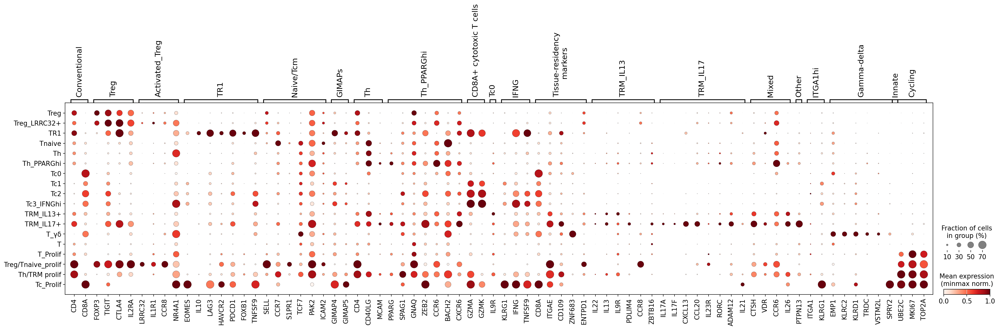

In [32]:
sc.pl.dotplot(adata_ii, 
              remove_markers(ALL_T),
              groupby=CATEGORY,
              dendrogram=False, 
                standard_scale="var",
              dot_max=.7,
             categories_order = [x for x in ORDER_T if x in adata_ii.obs[CATEGORY].unique()],
              save="T_scrna_healthyskin.pdf",
                           colorbar_title="Mean expression\n(minmax norm.)"

             )


# sc.pl.dotplot(adata_5k_ii, 
#               remove_markers(ALL_T),
#               groupby=CATEGORY,
#               dendrogram=False, 
#                 standard_scale="var",
#              dot_max=0.3,
#                  save="T_xenium.pdf",
             
#              colorbar_title="Mean expression\n(minmax norm.)"
#              )



In [33]:
# NEW =  [ 'IKZF2', 'GK', 'KLHL2']
# sc.pl.dotplot(adata_ii, 
#               remove_markers(NEW),
#               groupby=CATEGORY,
#               dendrogram=False, 
#                 standard_scale="var",
#               dot_max=.7,
#              categories_order = [x for x in ORDER_T if x in adata_ii.obs[CATEGORY].unique()],
#             #  save="T_scrna.pdf",
#                            colorbar_title="Mean expression\n(minmax norm.)"

#              )


# sc.pl.dotplot(adata_5k_ii, 
#               remove_markers(NEW),
#               groupby=CATEGORY,
#               dendrogram=False, 
#                 standard_scale="var",
#              dot_max=0.3,
#               #   save="T_xenium.pdf",
             
#              colorbar_title="Mean expression\n(minmax norm.)"
#              )



In [34]:
import pickle

file_path = '/nfs/team298/ls34/color_for_adult_skin2.pkl'

with open(file_path, 'rb') as file:
    palette_dict = pickle.load(file)


In [35]:
# SLIDE_ID = adata_5k_i.obs.info_id6.value_counts().head(1).index[0]
# print(SLIDE_ID)
# adata_5k_slide = adata_5k[adata_5k.obs["info_id6"]==SLIDE_ID]
# CELL_TYPES =  adata_5k_i.obs[CATEGORY].unique()
# adata_5k_slide.obs["test"] = [x if x in CELL_TYPES  else "Other" for x in adata_5k_slide.obs[CATEGORY]]

# fallback = "#BFBFBF"

# # make column categorical (once)
# adata_5k_slide.obs["test"] = adata_5k_slide.obs["test"].astype("category")

# cat_order   = list(adata_5k_slide.obs["test"].cat.categories)
# palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
# adata_5k_slide.uns["test_colors"] = palette_vec

# sc.pl.spatial(
#     adata_5k_slide,
#     color="test",
#     spot_size=10,
#     title="",
#     #title=INFO_ID, #+ "_nonlesional",
#     legend_loc=None,
#     # legend_loc="on data",
#             edgecolor="black",
#     linewidth=0.04,
#             legend_fontsize=4,
#         save="t_slide.pdf"

#    # save=f"3f_{DONOR_ID}.pdf"
#     #cmap="Reds",
#            # vmax=2,




# )


In [36]:
# ALLT2 = {'Innate': [
#   'KLRB1',
#   'KLRC1',
#   'TYROBP',
#   'FCER1G',
# ],
#          "NK/ILC1": ['PRF1','KLRD1','TBX21','IRF8',  'KLRF1',
#   'KLRG1','KLRC2',
#   'KLRC3', 'CEBPD',"FGR", "EOMES", "IFNG", 'SLA2', 'KIR2DL4', 'SH2D1B', 'SLFN13', 'TMIGD2'],
#  'NK': [  'FCGR3A',
 
#   'CX3CR1',
#   'CCL4L2',
#   'PRSS23', 'B3GAT1',
#        'SPON2',
#   'S1PR5',
#   'AKR1C3',
#          'FGFBP2',



#   'S100B'],

#          "ILC1": [ "ADGRG3", "APOBEC3D", "GZMA", 'GZMK', 'OASL',  "CXCR3", 'CXCR6' , "TNFSF10" ],
#          "ILC1_NKp46":  ['NCR1','NCAM1','P2RX7','ZNF407','IL18','ZBTB20','CASK','ITGA1',
#  'PLCB1','ADAM28','CNR2'],
#           'ILC3': ['ID3','CSF2', 'KRT86',
#  # 'ZBTB46',
#   'TNFSF4',
#   'SPINK2',
#   'RAMP1',
#   'MB',
#   'KLRF2',
#   'TMPRSS11E', "ZNF683"],
#            'PTGDS': [  'PTGDS', 'PDLIM4', 'CCL1', 'IL1RN', 'PTGS1', 'PTP4A1'],


#  'ILC2+3': ['IL9R', 'TNFSF11'],
#  'ILC2': ['GATA3',  'IL18R1','KIT', 'PTGDR2', 'TNFRSF25',
#           'CRLF2',
#   'IL17RB',
#   'IL1RL1',

#   'PPARG',
#   'PTGS2',
#   'PLA2G4A',
#   #'IL4',

#   'ICOS',
#   'NRROS',     'IL31',
# 'IL22', 'IL13', "IL5",#'PDLIM4', 'CCL1',
#           #'AREG', 'CCR8',
#           'IL9R'],
#  # 'Naive/Tcm': ['SELL', 'CCR7', 'S1PR1', 'TCF7', 'PAK2', 'ZHX2'],
#  #        "NEW": ["PLXDC2", "AIF1", "RAB34", "NEDD4L", "PM20D2", "TNRC18", "JCHAIN", ],
#  # 'Cycling': ['UBE2C', 'MKI67', 'TOP2A'],
#  #        "RORC+": ["RORC",]
#         }

             
# sc.pl.dotplot(adata_ii, 
#               remove_markers(ALLT2),
#               groupby=CATEGORY,
#               dendrogram=False, 
#                 standard_scale="var",
 

#              #categories_order = [x for x in ORDER_T if x in adata_ii.obs[CATEGORY].unique()]

#              )


# # sc.pl.dotplot(adata_5k_ii, 
# #               remove_markers(ALLT2),
# #               groupby=CATEGORY,
# #               dendrogram=False, 
# #                 standard_scale="var",
# #              dot_max=0.3,
# #            # categories_order = ['NK', 'ILC1/NK', 'ILC1',  'ILC3', 'ILC3_CCL1+PTGDS+', 'ILC_prolif', 'ILC2',]

              
# #              )



# ilc only

In [37]:
adata_ii = adata_i[(adata_i.obs[CATEGORY].str.startswith("ILC"))|
                   (adata_i.obs[CATEGORY].str.startswith("NK"))]
adata_ii.obs[CATEGORY].value_counts()

lvl5_annotation
ILC3          572
ILC1          262
NK            178
ILC2           20
ILC_Prolif      4
Name: count, dtype: int64

In [38]:
# adata_5k_ii = adata_5k[(adata_5k.obs[CATEGORY].str.startswith("ILC"))|
#                    (adata_5k.obs[CATEGORY].str.startswith("NK"))]


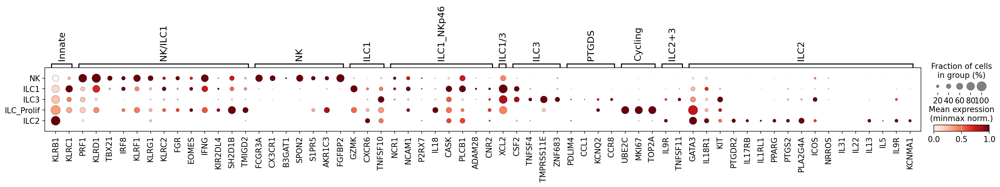

In [39]:
ALLT2 = {'Innate': [
  'KLRB1',
  'KLRC1',
  'TYROBP',
  'FCER1G',
],
         "NK/ILC1": ['PRF1','KLRD1','TBX21','IRF8',  'KLRF1',
  'KLRG1','KLRC2',
  'KLRC3', 'CEBPD',"FGR", "EOMES", "IFNG", 'SLA2', 'KIR2DL4', 'SH2D1B', 'SLFN13', 'TMIGD2'],
 'NK': [  'FCGR3A',
 
  'CX3CR1',
  'CCL4L2',
  'PRSS23', 'B3GAT1',
       'SPON2',
  'S1PR5',
  'AKR1C3',
         'FGFBP2',



  'S100B'],

         "ILC1": [ "ADGRG3", 'GZMK', 'OASL', 'CXCR6' , "TNFSF10" ],
         "ILC1_NKp46":  [ 'NCR1', 'NCAM1',  'P2RX7',   'ZNF407', "IL18",'ZBTB20', 'CASK',# "ITGA1",
                       'PLCB1', 'ADAM28',  'CNR2'
                        ],
 'ILC1/3': ['XCL1', 'XCL2', ],
          'ILC3': ['ID3','CSF2', 'KRT86',
 # 'ZBTB46',
  'TNFSF4',
  'SPINK2',
  'RAMP1',
  'MB',
  'KLRF2',
  'TMPRSS11E', "ZNF683"],
           'PTGDS': [  'PTGDS', 'PDLIM4', 'CCL1',
                   # "MYO1E", "PTGER3",
                     'KCNQ2', #'CDCP1', 'LILRA2','HHEX', 
                     'CCR8'
                    ],
  'Cycling': ['UBE2C', 'MKI67', 'TOP2A'],

 'ILC2+3': ['IL9R', 'TNFSF11'],
 'ILC2': ['GATA3',  'IL18R1','KIT', 'PTGDR2', 'TNFRSF25',
          'CRLF2',
  'IL17RB',
  'IL1RL1',

  'PPARG',
  'PTGS2',
  'PLA2G4A',
  #'IL4',

  'ICOS',
  'NRROS',     'IL31',
'IL22', 'IL13', "IL5",#'PDLIM4', 'CCL1',
          #'AREG', 'CCR8',
          'IL9R',
         
         
         # "MAF", "MCAM", "NTRK2", "IL26","PLN",
          "KCNMA1",
         ],
 # 'Naive/Tcm': ['SELL', 'CCR7', 'S1PR1', 'TCF7', 'PAK2', 'ZHX2'],
 #        "NEW": ["PLXDC2", "AIF1", "RAB34", "NEDD4L", "PM20D2", "TNRC18", "JCHAIN", ],
 #        "RORC+": ["RORC",]
        }

             
sc.pl.dotplot(adata_ii, 
              remove_markers(ALLT2),
              groupby=CATEGORY,
              dendrogram=False, 
                standard_scale="var",
                           colorbar_title="Mean expression\n(minmax norm.)",
             categories_order = [x for x in ORDER_T if x in adata_ii.obs[CATEGORY].unique()],
                           save="ILC_scrna_healthyskin.pdf"

            )


# sc.pl.dotplot(adata_5k_ii, 
#               remove_markers(ALLT2),
#               groupby=CATEGORY,
#               dendrogram=False, 
#                 standard_scale="var",
#              dot_max=0.3,
#                            colorbar_title="Mean expression\n(minmax norm.)",
#          categories_order = [x for x in ORDER_T if x in adata_5k_ii.obs[CATEGORY].unique()],
#                                               save="ILC_xenium.pdf"

#               #['NK', 'ILC1/NK', 'ILC1',  'ILC3', 'ILC3_CCL1+PTGDS+', 'ILC_prolif', 'ILC2',]

              
#              )
# # try:
# #     sc.pl.dotplot(adata_ii, 
# #                 ALLT2,
# #                   groupby=CATEGORY,
# #                   dendrogram=False, 
# #                     standard_scale="var",
# #                  categories_order = [x for x in ORDER_T if x in adata_ii.obs[CATEGORY].unique()]

# #                 )
# # except:
# #     1

In [40]:
# sc.pl.dotplot(adata[(adata.obs[CATEGORY].str.startswith("TRM"))|
#                     (adata.obs[CATEGORY].str.startswith("ILC"))|
#                     (adata.obs[CATEGORY].str.startswith("cDC"))
#                    ]     , 
#               remove_markers(ALLT2),
#               groupby=CATEGORY,
#               dendrogram=False, 
#                 standard_scale="var",
#                            colorbar_title="Mean expression\n(minmax norm.)",
#            #  categories_order = [x for x in ORDER_T if x in adata_ii.obs[CATEGORY].unique()],
#             #               save="ILC_scrna.pdf"

#             )


# # sc.pl.dotplot(adata_5k[(adata_5k.obs[CATEGORY].str.startswith("TRM"))|
# #                     (adata_5k.obs[CATEGORY].str.startswith("ILC"))|
# #                     (adata_5k.obs[CATEGORY].str.startswith("cDC"))
# #                    ]     , 
# #               remove_markers(ALLT2),
# #               groupby=CATEGORY,
# #               dendrogram=False, 
# #                 standard_scale="var",
# #              dot_max=0.3,
# #                            colorbar_title="Mean expression\n(minmax norm.)",
# #          #categories_order = [x for x in ORDER_T if x in adata_5k_ii.obs[CATEGORY].unique()],
# #                                           #    save="ILC_xenium.pdf"

# #               #['NK', 'ILC1/NK', 'ILC1',  'ILC3', 'ILC3_CCL1+PTGDS+', 'ILC_prolif', 'ILC2',]

              
# #              )

In [41]:
# adata_ilc_x = adata[(adata.obs[CATEGORY].str.startswith("TRM"))|
#                     (adata.obs[CATEGORY].str.startswith("ILC"))|
#                     (adata.obs[CATEGORY].str.startswith("cDC"))
#                    ]   .copy()
# vc = adata_ilc_x.obs[CATEGORY].value_counts()

# keep = vc[vc >= 2].index

# adata_ilc_x = adata_ilc_x[adata_ilc_x.obs[CATEGORY].isin(keep)].copy()
# import pandas as pd
# sc.tl.rank_genes_groups(adata_ilc_x, CATEGORY, method='t-test', key_added="de_leiden");
# df2 = pd.DataFrame(adata_ilc_x.uns['de_leiden']['names'])
# #df2.to_pickle("degs_niche.pkl")



In [42]:
# select_population = list(df2.columns)[4]  # JAW
# print(select_population)
# genes0 = df2[select_population][:50]
# genes1 = df2[select_population][50:100]
# genes2 = df2[select_population][100:150]
# genes3 = df2[select_population][150:200]
# genes4 = df2[select_population][200:250]
# genes5 = df2[select_population][250:300]
# genes6 = df2[select_population][300:350]

# CATEGORY="lvl5_annotation"

# sc.pl.dotplot(
#     adata_ilc_x,
#     genes0,
#     groupby=CATEGORY,
#     standard_scale="var",
#     dendrogram=False, 
#     dot_max=1,
# )
# sc.pl.dotplot(
#     adata_5k[(adata_5k.obs[CATEGORY].str.startswith("TRM"))|
#                     (adata_5k.obs[CATEGORY].str.startswith("ILC"))|
#                     (adata_5k.obs[CATEGORY].str.startswith("cDC"))
#                    ],
#     genes0,
#     groupby=CATEGORY,
#  standard_scale="var",
#     dendrogram=False, 
#         dot_max=0.5,

# ) 



In [43]:
# select_population = list(df2.columns)[4]  # JAW
# print(select_population)
# genes0 = df2[select_population][:50]
# genes1 = df2[select_population][50:100]
# genes2 = df2[select_population][100:150]
# genes3 = df2[select_population][150:200]
# genes4 = df2[select_population][200:250]
# genes5 = df2[select_population][250:300]
# genes6 = df2[select_population][300:350]

# CATEGORY="lvl5_annotation"

# sc.pl.dotplot(
#     adata_ilc_x,
#     genes1,
#     groupby=CATEGORY,
#     standard_scale="var",
#     dendrogram=False, 
#     dot_max=1,
# )
# sc.pl.dotplot(
#     adata_5k[(adata_5k.obs[CATEGORY].str.startswith("TRM"))|
#                     (adata_5k.obs[CATEGORY].str.startswith("ILC"))|
#                     (adata_5k.obs[CATEGORY].str.startswith("cDC"))
#                    ],
#     genes1,
#     groupby=CATEGORY,
#  standard_scale="var",
#     dendrogram=False, 
#         dot_max=0.5,

# ) 



In [44]:
# select_population = list(df2.columns)[4]  # JAW
# print(select_population)
# genes0 = df2[select_population][:50]
# genes1 = df2[select_population][50:100]
# genes2 = df2[select_population][100:150]
# genes3 = df2[select_population][150:200]
# genes4 = df2[select_population][200:250]
# genes5 = df2[select_population][250:300]
# genes6 = df2[select_population][300:350]

# CATEGORY="lvl5_annotation"

# sc.pl.dotplot(
#     adata_ilc_x,
#     genes2,
#     groupby=CATEGORY,
#     standard_scale="var",
#     dendrogram=False, 
#     dot_max=1,
# )
# sc.pl.dotplot(
#     adata_5k[(adata_5k.obs[CATEGORY].str.startswith("TRM"))|
#                     (adata_5k.obs[CATEGORY].str.startswith("ILC"))|
#                     (adata_5k.obs[CATEGORY].str.startswith("cDC"))
#                    ],
#     genes2,
#     groupby=CATEGORY,
#  standard_scale="var",
#     dendrogram=False, 
#         dot_max=0.5,

# ) 



In [45]:
# stop

In [46]:
# ILC1_CCL1_GENES = {"ILC3":   ['ID3','CSF2', 'KRT86',
#  # 'ZBTB46',
#   'TNFSF4',
#   'SPINK2',
#   'RAMP1',
#   'MB',
#   'KLRF2',
#   'TMPRSS11E', "ZNF683"],
    
#                     "Polarised": ["MB" ,"KRT86", "NEDD8", "EVL" , "KRT81", "ZNF683", "SIRPG", "PYCARD",
#                   "MVP", "SDHC", "KRT14", "NME1", "NCR3", 
#                    "CST6",
                  
#                   ]}
# sc.pl.dotplot(adata_ii, 
#               remove_markers(ILC1_CCL1_GENES),
#               groupby=CATEGORY,
#               dendrogram=False, 
#                 standard_scale="var",
#              #categories_order = [x for x in ORDER_T if x in adata_ii.obs[CATEGORY].unique()]

#              )


# sc.pl.dotplot(adata_5k_ii, 
#               remove_markers(ILC1_CCL1_GENES),
#               groupby=CATEGORY,
#               dendrogram=False, 
#                 standard_scale="var",
#              dot_max=0.3,)


In [47]:
# SLIDE_ID = adata_5k_ii.obs.info_id6.value_counts().head(1).index[0]
# CELL_TYPES =  adata_5k_ii.obs[CATEGORY].unique()

# print(SLIDE_ID)
# adata_5k_slide = adata_5k[adata_5k.obs["info_id6"]==SLIDE_ID]
# adata_5k_slide.obs["test"] = [x if x in CELL_TYPES  else "Other" for x in adata_5k_slide.obs[CATEGORY]]

# fallback = "#BFBFBF"

# # make column categorical (once)
# adata_5k_slide.obs["test"] = adata_5k_slide.obs["test"].astype("category")

# cat_order   = list(adata_5k_slide.obs["test"].cat.categories)
# palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
# adata_5k_slide.uns["test_colors"] = palette_vec

# sc.pl.spatial(
#     adata_5k_slide,
#     color="test",
#     spot_size=10,
#     title="",
#     #title=INFO_ID, #+ "_nonlesional",
#     #legend_loc=None,
#     # legend_loc="on data",
#             edgecolor="black",
#     linewidth=0.04,
#             legend_fontsize=4,
#         save="ilc_slide.pdf"

#    # save=f"3f_{DONOR_ID}.pdf"
#     #cmap="Reds",
#            # vmax=2,




# )


# other

In [48]:
adata_i = adata[(adata.obs["lvl1_new"]=="Other")|
               (adata.obs[CATEGORY]=="Bcell")|
                   (adata.obs[CATEGORY]=="Plasma cell")|
                               (adata.obs["lvl1_new"]=="Schwann")
                
               ]
adata_i=adata_i[adata_i.obs[CATEGORY]!="Mast cell"]
adata_i.shape

(9534, 30977)

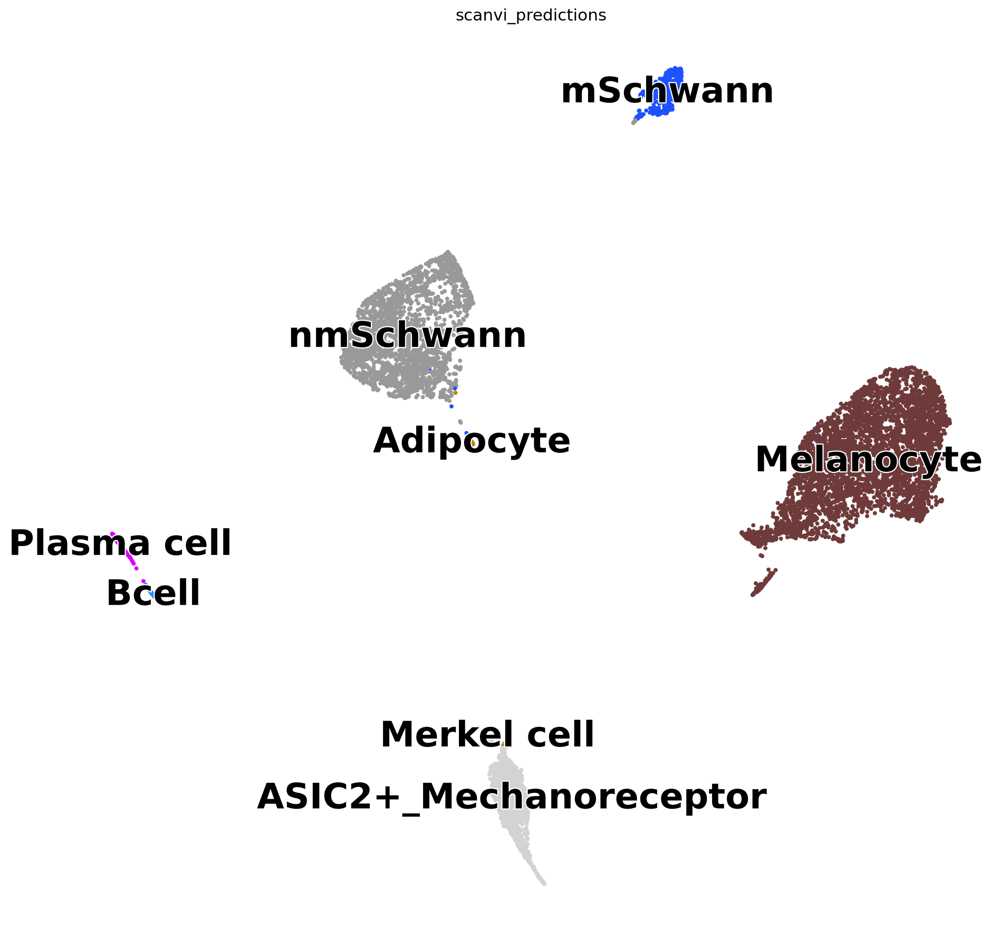

In [49]:
NEIGHBOR=20
latent_key = "neighbor_20"
sc.pp.neighbors(adata_i, use_rep = 'X_scanvi', metric = "euclidean", n_neighbors=NEIGHBOR,key_added=f"neighbor_{NEIGHBOR}")
sc.tl.umap(adata_i, min_dist=0.1, neighbors_key =f"neighbor_{NEIGHBOR}" )
# sc.tl.leiden(adata, resolution=2, key_added="latent_leiden2", #neighbors_key= latent_key 
#              )

sc.pl.umap(
        adata_i,
        color=["scanvi_predictions"],
        legend_loc="on data",
        s=50,
        legend_fontsize=30,
        legend_fontoutline=2,
        show=True,
   palette=colors,
   # title=MODEL,
        save="OTHERumap.pdf"

   # groups="Plasma cell",
#     linewidth=0.1,
#     edgecolor='grey',
    
  #   palette=["#F2F2F2",   "#87CEEB",    ],

    )


In [50]:
# adata_5k_i = adata_5k[(adata_5k.obs["lvl0"]=="Other")|
#                 (adata_5k.obs[CATEGORY]=="Melanocyte")|
#                 (adata_5k.obs[CATEGORY]=="Adipocyte")|
#                    (adata_5k.obs[CATEGORY]=="Plasma cell")|
#                         (adata_5k.obs[CATEGORY]=="Bcell")|
#                (adata_5k.obs["lvl1_new"]=="Schwann")
#                      ]

# adata_5k_i.shape

In [51]:
import pandas as pd
desired_order = [ 'Melanocyte', 'mSchwann',  'nmSchwann', 
                 'Merkel cell',"Mechanoreceptor_ASIC2+", "Mechanoreceptor ASIC2+","ASIC2+_Mechanoreceptor",

                 'Cartilage',  'Adipocyte', #'Mast cell',
               'Bcell', "Plasma cell2", 'Plasma cell', 
                # 'Neutrophil'
                 'Melanocyte doublet3',
'nmSchwann*',
'Erythroid',
'Merkel partly?',
'Melanocyte_T doublet2',
'Melanocyte doublet1',
'Satellite muscle', 'Satellite cell', "missing"
                ]


# Ensure 'lvl3_annotation' is categorical
if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):
    adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].astype('category')

if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):
    adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].astype('category')

missing_data = 0
for x in list(adata_i.obs[CATEGORY].unique()):
    if x not in desired_order:
        print(x)
        missing_data +=1
if missing_data != 0:
    stop
        

# Set the categories in the desired order
adata_i.obs[CATEGORY] = pd.Categorical(
    adata_i.obs[CATEGORY],
    categories=desired_order,
    ordered=True
)



/tmp/ipykernel_3798992/3822947581.py:19: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):
/tmp/ipykernel_3798992/3822947581.py:22: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):


In [52]:
# if not pd.api.types.is_categorical_dtype(adata_5k_i.obs[CATEGORY]):
#     adata_5k_i.obs[CATEGORY] = adata_5k_i.obs[CATEGORY].astype('category')

# missing_data = 0
# for x in list(adata_5k_i.obs[CATEGORY].unique()):
#     if x not in desired_order:
#         print(x, missing_data)
#         missing_data +=1
# print("Number of missing items: ", missing_data)
# if missing_data != 0:
#     stop
        

# # Set the categories in the desired order
# adata_5k_i.obs[CATEGORY] = pd.Categorical(
#     adata_5k_i.obs[CATEGORY],
#     categories=desired_order,
#     ordered=True
# )


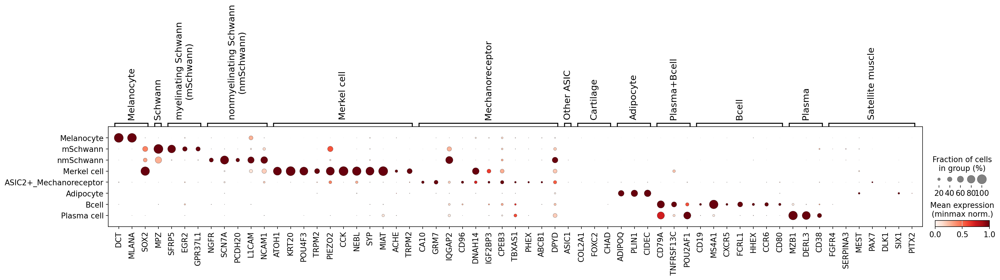

In [53]:
MISC_IMMUNE_SHORT = {#"LRRC32_genes": ["SIRT6", "GRWD1", "CWC25", "LRRC32", "ARMCX1", "MRPL50", "PID1", "ZNF593", "NR1D1",
               #                "CCRL2" , "FOSL1", "ACHE", "SYNGAP1", "PHLDB1" , "IRF2"],
               #"TREM2_MAC": ["AXL", "C3", "FCGR3A", "TNFSF13", "IGSF21", "TREM2", "CD276", "SOCS6", "MERTK", "TNFSF12", "SLC12A5", "HTRA1", "IFITM10"],
               
        #"BCELL+PLASMA+PDC": ["IGKC",  "MZB1","ST6GALNAC4", "GAB1",],
        "Melanocyte": ["DCT", "MLANA", "PMEL", "SOX2",],
    "Schwann": ["MPZ",],
           "myelinating Schwann\n(mSchwann)": ['NFASC', 'NCMAP', 'MBP', 'PRX', "SFRP5","EGR2",
                                            "CLDN19", "GPR37L1"],
           
           "nonmyelinating Schwann\n(nmSchwann)": ['NGFR', 'SCN7A',   "PCDH20", 
                                                        'L1CAM', 'NCAM1'],

    
            "Merkel cell": ["ATOH1", "KRT20", "POU4F3", "TRPM2", "PIEZO2", "ASIC3", 
                           "CCK", "NEBL", "SYP", "MIAT", "ACHE","TRPM2",
                           ],
    "Mechanoreceptor": ["ASIC2","CA10", "DCC", "CDH4", "CDH18","GRM8",
                        "LRP1B", #"IL1RAPL1","CTNNA2", "SUGCT", "NRXN1", "OPCML", 
               "RBFOX1", #"DOK6", 
               "HYDIN", #"RYR3",
               "RALYL", "GRM7", "NDST3",  'CSMD1','LHFPL3',
'IQGAP2', 'CD96', 'DNAH14', 'IGF2BP3', 'CPEB3', 'TBXAS1', 'PHEX', 'ABCB1', 'DPYD',                        
               #"HULC", "RYR3", "DMD", "ROBO2", "TENM2", "NRG3", "PCAT1", "CACNA2D3", 
               #"DLC1", "NAV3"
              
                       ],
    "Other ASIC": ["ASIC1", "ASIC4"],
    
    "Cartilage": ["ACAN", "COL2A1", "FOXC2", "CHAD"],
        "Adipocyte": ["ADIPOQ",  "FABP4", "PLIN1", "CIDEC"],

    "Plasma+Bcell": ["CD79A", "TNFRSF13C", "POU2AF1"  ],
                    "Bcell": ["CD19", "MS4A1", # CD20 = MS4A1
                              "CXCR5", "SHISA8", "FCRL1", "HHEX","CCR6",
                              
                              'CD80', 
                              
                              
                        # "CD80", "CD86", "HLA-DRA", "HLA-DRB1" 
                              ],
#       "B2": [
#      #"CXCL12",
#     #"LILRB4",
#     #"SLIT3",
#     "SELL",
#     #"TNFSF13B",
#    # "TNFSF10",
#     "PRKCB",
#     "IRF8", "IRF4",
#              "GZMB",   "SVIL",
#     "IL3RA",
#            "CD86", "TLR9" 
# ] ,

        "Plasma": ["SDC1", "JCHAIN","MZB1","DERL3", #"SPAG4", 
                   "CD38", ],
  
           #    "PDC": [ "MAP1A", "PTCRA" , "IL3RA", "P2RY6", "PTCRA",  "LILRA4", "RHEX", "SCT"],
             'Satellite muscle': ['FGFR4',
  'SERPINA3',
  'MEST',
 # 'H19',
  'PAX7',
  'DLK1',
  'SIX1',
  'PITX2'],
#   'pDC': ['CLEC4C',  #'IL3RA', 'TNFRSF21', 
         
#         'LILRA4', 'PTCRA', 'IGKJ5', 'LAMP5', "P2RY6",# "ITGAE", 
#           "PTGDS"],
# "pDC_extra": ['LAMP5', 'TLR9',  'SMIM5', 'IGKJ5', 'EPDR1',],
    

               
      #  "Plasma_in_immuneonc": ["MZB1", "CENPV", "CXCL13", "RORC", "MCEMP1", "AIRE"]

               
}


adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].astype("category").cat.remove_unused_categories()
#adata_5k_i.obs[CATEGORY] = adata_5k_i.obs[CATEGORY].astype("category").cat.remove_unused_categories()

sc.pl.dotplot(
    adata_i,
              remove_markers(MISC_IMMUNE_SHORT),
    groupby=CATEGORY,
    standard_scale="var",
    dendrogram=False,
                               colorbar_title="Mean expression\n(minmax norm.)",
                                    save="misc_scrna_healthyskin.pdf"

) 
# adata_5k_i.obs[CATEGORY] = adata_5k_i.obs[CATEGORY].astype("category").cat.remove_unused_categories()

# sc.pl.dotplot(adata_5k_i, 
#               remove_markers(MISC_IMMUNE_SHORT),
#               groupby=CATEGORY,
#               dendrogram=False, 
#                 standard_scale="var",
#                                          colorbar_title="Mean expression\n(minmax norm.)",
#              dot_max=0.3,
#                          save="misc_xenium.pdf"
#              )
 

In [54]:
# SLIDE_ID = adata_5k_i.obs.info_id6.value_counts().head(1).index[0]
# print(SLIDE_ID)
# adata_5k_slide = adata_5k[adata_5k.obs["info_id6"]==SLIDE_ID]
# CELL_TYPES =  adata_5k_i.obs[CATEGORY].unique()
# adata_5k_slide.obs["test"] = [x if x in CELL_TYPES  else "Other" for x in adata_5k_slide.obs[CATEGORY]]

# fallback = "#BFBFBF"

# # make column categorical (once)
# adata_5k_slide.obs["test"] = adata_5k_slide.obs["test"].astype("category")

# cat_order   = list(adata_5k_slide.obs["test"].cat.categories)
# palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
# adata_5k_slide.uns["test_colors"] = palette_vec

# sc.pl.spatial(
#     adata_5k_slide,
#     color="test",
#     spot_size=10,
#     title="",
#     #title=INFO_ID, #+ "_nonlesional",
#     legend_loc=None,
#     # legend_loc="on data",
#             edgecolor="black",
#     linewidth=0.04,
#             legend_fontsize=4,
#         save="misc_slide.pdf"

#    # save=f"3f_{DONOR_ID}.pdf"
#     #cmap="Reds",
#            # vmax=2,




# )


In [55]:
# sc.pl.dotplot( adata_5k_i[adata_5k_i.obs["niche14"]=="Plasma_cell_niche"], 
#               remove_markers(MISC_IMMUNE_SHORT),
#               groupby=CATEGORY,
#               dendrogram=False, 
#                 standard_scale="var",
#              dot_max=0.3,)

# myeloid

In [56]:
adata_i = adata[(adata.obs["lvl1_new"]=="Myeloid")|
                (adata.obs[CATEGORY]=="Mast cell")|
                                (adata.obs[CATEGORY]=="Neutrophil")

               ]
       
adata_i.shape
 


desired_order = [ 'Mono','Monocyte', 'Mono CD16+','Monocyte1','Monocyte2','Monocyte blood (cd16+)',
                      'Mac1',

                 
     'Mac2',         'Mac2_A','Mac2_b', "Mac2_CCL14hi",
                 'Mac2_CCL14highest',
                 
                 
                 
       








                'Mac_TREM2+LPL+',

                  'MacTREM2_CX3CR1+','Mac_TREM2+CX3CR1+',"Mac_CX3CR1+",
                 'Transitional DC','TransitionalDC',"TransitionalDC_CARD9+",
 "AXL+SIGLEC6+ DC",'cDC',
    'cDC1','cDC2','cDC2/Mac (Nondescript)',
 'cDC2: IL1B+',
 'cDC2: MMP12+', 'cDC2: MMP12hi','cDC2: MMP12+IL1B',"cDC2: EREG+CCR7+", "cDC2_cycling",


                'cDC2: MMP12hiIL1B+',


                 'MoDC',       'MoDC_OUTLIER1','MoDC_OUTLIER2','Mo_DC1','MoDC*',
                  'LC',"LC_SLC18A2+","LC_CCR7+",'LC2','LC*',
 'MigDC','MigDC (cDC1/stress)','MigDC (cDC1)','MigDC (cDC2)','MigDC_T_doublet?','MigDC2_T_doub',

 'pDC',"pDC_LAMP5+",
"pDC_IGKJ5+",
"pDC_CXCL2+CXCL3+",
     "Neutrophil","Mast cell",'Mast cell/doublet', 'Mac_T_doublet',
                 'Eosinophil','MoDC/MigDC/Mac stress','Mast cell_Tdoublet',
                 "Plasma cell", "missing","ASIC2+_Mechanoreceptor"
                 
          
 









]

# Ensure 'lvl3_annotation' is categorical
if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):
    adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].astype('category')

    
if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):
    adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].astype('category')

missing_data = 0
for x in list(adata_i.obs[CATEGORY].unique()):
    if x not in desired_order:
        print(x)
        missing_data +=1
if missing_data != 0:
    stop
        
        
# Set the categories in the desired order
adata_i.obs[CATEGORY] = pd.Categorical(
    adata_i.obs[CATEGORY],
    categories=desired_order,
    ordered=True
)
 

/tmp/ipykernel_3798992/428531296.py:67: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):
/tmp/ipykernel_3798992/428531296.py:68: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].astype('category')
/tmp/ipykernel_3798992/428531296.py:71: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):


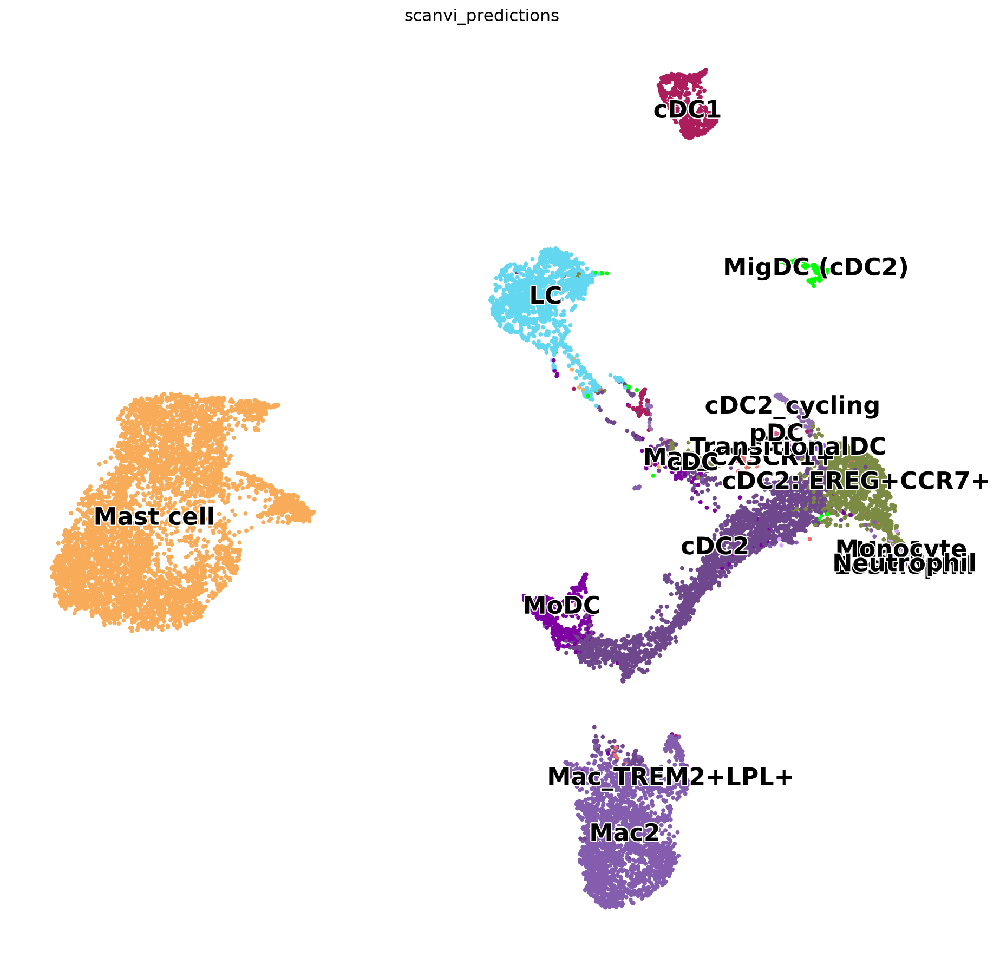

In [57]:
NEIGHBOR=20
latent_key = "neighbor_20"
sc.pp.neighbors(adata_i, use_rep = 'X_scanvi', metric = "euclidean", n_neighbors=NEIGHBOR,key_added=f"neighbor_{NEIGHBOR}")
sc.tl.umap(adata_i, min_dist=0.1, neighbors_key =f"neighbor_{NEIGHBOR}" )
# sc.tl.leiden(adata, resolution=2, key_added="latent_leiden2", #neighbors_key= latent_key 
#              )

sc.pl.umap(
        adata_i,
        color=["scanvi_predictions"],
        legend_loc="on data",
        s=50,
        legend_fontsize=20,
        legend_fontoutline=2,
        show=True,
   palette=colors,
    #title=MODEL,
        save="MYELOIDumap.pdf"

   # groups="Plasma cell",
#     linewidth=0.1,
#     edgecolor='grey',
    
  #   palette=["#F2F2F2",   "#87CEEB",    ],

    )


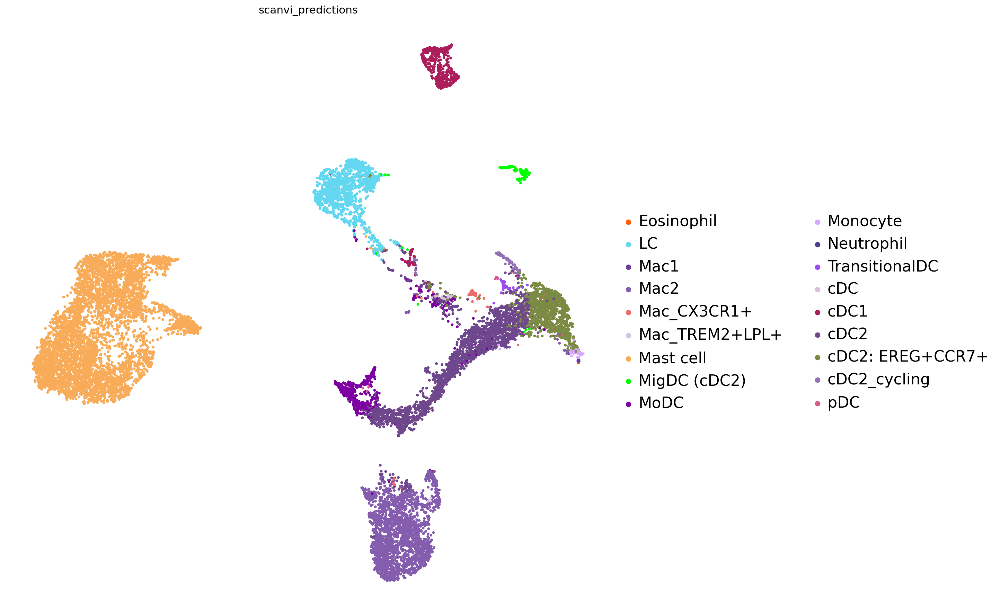

In [58]:
sc.pl.umap(
        adata_i,
        color=["scanvi_predictions"],
        #legend_loc="on data",
        s=50,
        legend_fontsize=20,
        legend_fontoutline=2,
        show=True,
   palette=colors,
    #title=MODEL,
        save="MYELOIDumap_legend.pdf"

   # groups="Plasma cell",
#     linewidth=0.1,
#     edgecolor='grey',
    
  #   palette=["#F2F2F2",   "#87CEEB",    ],

    )


In [59]:
# adata_5k_i = adata_5k[(adata_5k.obs["lvl0"]=="Myeloid")|
#                          (adata_5k.obs[CATEGORY]=="Mast cell") |
#                       (adata_5k.obs[CATEGORY]=="LC_ALOX15hi") 
                      
 
#                ]
# adata_i.shape
 
 
# if not pd.api.types.is_categorical_dtype(adata_5k_i.obs[CATEGORY]):
#     adata_5k_i.obs[CATEGORY] = adata_5k_i.obs[CATEGORY].astype('category')

    
# if not pd.api.types.is_categorical_dtype(adata_5k_i.obs[CATEGORY]):
#     adata_5k_i.obs[CATEGORY] = adata_5k_i.obs[CATEGORY].astype('category')

# missing_data = 0
# for x in list(adata_5k_i.obs[CATEGORY].unique()):
#     if x not in desired_order:
#         print(x)
#         missing_data +=1
# if missing_data != 0:
#     stop
        
        
# # Set the categories in the desired order
# adata_5k_i.obs[CATEGORY] = pd.Categorical(
#     adata_5k_i.obs[CATEGORY],
#     categories=desired_order,
#     ordered=True
# )
 
    

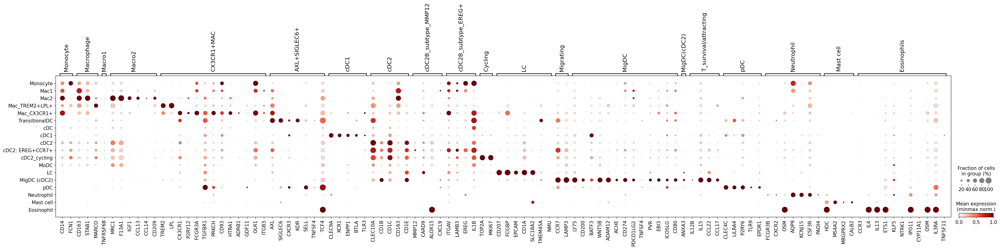

In [60]:
mac_markers={ 'Monocyte': ['CD14', 'VCAN', 'S100A8', 'S100A9', 
              'S100A12', "FCN1",'MEFV'], #"FCGR3A"
 #'Monocyte1': ['SERPINB2', 'MTF1', 'PTGER2'],
 #'Monocyte2': ['aaFCGR1A', 'SYT1', 'ASGR1', 'PRAM1', 'CCR2'],
# 'Mono_KC': ['KRT16', 'EGFR'],
 'Macrophage': ['C1QA', 'C1QC',  'CD163', 'CCL4', "STAB1",'MARCO', ],
      'Macro1': ['SLAMF9', 'TNFRSF6B',#"CXCL5", #"IL24"
                # "CCL24"
                ],

 'Macro2': ['MRC1','F13A1', "LYVE1","IGF1", "CCL13", 'CCL14', "CD209"],
 #'T': ['CD3E', 'CD96', 'TRBC1'],
 #'Macro_NEU4/LRRC32': ['CCL4L2', 'CCRL2', 'ACHE', 'NEU4', 'IL23A', 'CD40'],
# 'TREM2+ADAMDEC1+': ['TREM2', 'CXCL5', 'EPHB2', 'STAC', 'FAM20C'],
 'CX3CR1+MAC': ['TREM2', 'SPP1',  "LPL", 'CX3CR1', #'ADRB1', 
              # "KCNQ3"#"UNC5B", "GPR34", "SMAD7",  "CD72", "TGFBR1", 
             #  "CD9",
               
                "P2RY12", #'ADAMDEC1',
                'FCGR3A', 
                'TGFBR1', 'PRKCH', 'CD93', 'HTRA1', "ADRB1",
                'GDF11', 'OLR1', 'ITGB3'
               ],
             'AXL+SIGLEC6+': ['AXL', 'SIGLEC6', 'NUMBL', 'IFI27', 'CXCR3', 'PLXNA4', 'KDR', "SELL",
                             "TNFSF4", "TCF4"],

 'cDC1': ['CLEC9A', 'XCR1', "ENPP1", "PPY", "BTLA", "TLR3"],
             #"Mature cDC1": ["ITGAE", "CD8A"],
 'cDC2': ['CLEC10A', 'CD1B', 'CD1C', "CD163", 'CD1E', # 'CD5', 
          #'SPIB', 'TNFSF4', 'TSPAN2'
         ],

             'cDC2B_subtype_MMP12': ['MMP12', "CST6", "GGT5", "CARD9",  "ALOX15", "CXCL9",#'CROCC',
                   ],
              'cDC2B_subtype_EREG+': ["ITGAV","LAMB3", 
 "EREG",'IL1B', #'CROCC',
                                       #"SATB1",
                                     # "EHD1", "LUCAT1", "ITGAV", "OLR1", "TNFRSF4", "DOT1L", "DOCK4",
          #    "ADA", "MMP19", "ELK1", "LAMB3", "MIR3142HG", "GPR35",   "ISG20", "CXCL3", "MMP9",  
                   ],
                    "Cycling": ["TOP2A", "MKI67"],
             # 'MoDC': ["PLK2", "KLF2", "THBS1"
             #     #'THBS1',  'C1QTNF1', "INHBA", "TNFRSF4"
             # ],

 'LC': ['CD207','FCGBP', "EPCAM", 'CD1A', "SLC18A2", "TMEM45A", "IL22RA2","NMU" #"CLEC4A"
       ],
              'Migrating': ['CCR7', 'LAMP3',  ], 

 'MigDC': ['LY75', "CD200",  "BATF3",'SLCO5A1', 'WNT5B', 'ADAM12', "ACHE",
           "CD274", "PDCD1LG2",  "TNFSF4", "PVR", "RAMP1" , "EBI3","ICOSLG",
          "TREML1", "CD80", ],  #'ST8SIA1', 'CCL19', "CCL17", "CCL22",
         
     #"TFPI", "SERINC2", #"IL10",
          #'LILRA1', 'LILRA2'
             "MigDC(cDC2)": ["ANXA3"],
             "T_survival/attracting": ["IL12B", "IL15",  "CCL22", "CCL17", ],
 'pDC': ['CLEC4C',  #'IL3RA', 'TNFRSF21', 
         
         'LILRA4', 'PTCRA', 'IGKJ5', 'LAMP5', "P2RY6",# "ITGAE", 
         "PTGDS",'LAMP5', 'TLR9',  'SMIM5', 'IGKJ5', 'EPDR1',],
 'Neutrophil': [#'CXCL8',
     'FCGR3B', "CXCR2", "PROK2", "OSM",  #KCNJ15, ADGRG3
        "AQP9",
    "KCNJ15",
 
    #"CXCL12",
    #"LILRB4",
    #"SLIT3",
    "CSF3R",
    #"TNFSF13B",
   # "TNFSF10",
    "PADI4",
                # "MPO"
               ], 
                      #(adata.obs[CATEGORY]== "Neutrophil")]
              "Mast cell": [#"HPGDS", "KIT", "HPGD",
                    "HDC", #"GATA2",   
                    "TPSAB1", "TPSB2", "MS4A2","MRGPRX2",
                              "CALB2", "ALDH1A1" #"CAVIN2", "HEY1"
                ],
          
               "Eosinophils": [ "CLC", "CCR3",#"CCL23",    #"PTGDR2", "P2RY1", 
                         
                             "IL4",
    "IL13",
    "ETS1",
    "KLF5",
    "NTRK1",
 
    "IPO11",
    "CYP11A1",

    "OSM", 
   "IL3RA","MBP","CD200R1",    "TNFSF11",   "S100P",
                            
                           ], 
            #"OTHER": ["SECISBP2L"],
      
            }

adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].astype("category").cat.remove_unused_categories()
#adata_5k_i.obs[CATEGORY] = adata_5k_i.obs[CATEGORY].astype("category").cat.remove_unused_categories()

sc.pl.dotplot(adata_i, 
              remove_markers(mac_markers),
              groupby=CATEGORY, 
              dendrogram=False, 
                standard_scale="var",
                                         colorbar_title="Mean expression\n(minmax norm.)",

                     save="myeloid_scrna_healthyskin.pdf")
# sc.pl.dotplot(adata_5k_i, 
#               remove_markers(mac_markers),
#               groupby=CATEGORY,
#               dendrogram=False, 
#              colorbar_title="Mean expression\n(minmax norm.)",

#                 standard_scale="var", 
#               dot_max=0.3,
#              save="myeloid_xenium.pdf"
#              )
# # try:
# #     sc.pl.dotplot(adata_i, 
# #                   mac_markers,
# #                   groupby=CATEGORY, 
# #                   dendrogram=False, 
# #                     standard_scale="var"
# #                 )
# # except:
# #     1

In [61]:
# SLIDE_ID = adata_5k_i.obs.info_id6.value_counts().head(1).index[0]
# print(SLIDE_ID)
# adata_5k_slide = adata_5k[adata_5k.obs["info_id6"]==SLIDE_ID]
# CELL_TYPES =  adata_5k_i.obs[CATEGORY].unique()
# adata_5k_slide.obs["test"] = [x if x in CELL_TYPES  else "Other" for x in adata_5k_slide.obs[CATEGORY]]

# fallback = "#BFBFBF"

# # make column categorical (once)
# adata_5k_slide.obs["test"] = adata_5k_slide.obs["test"].astype("category")

# cat_order   = list(adata_5k_slide.obs["test"].cat.categories)
# palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
# adata_5k_slide.uns["test_colors"] = palette_vec

# sc.pl.spatial(
#     adata_5k_slide,
#     color="test",
#     spot_size=10,
#     title="",
#     #title=INFO_ID, #+ "_nonlesional",
#     legend_loc=None,
#     #legend_loc="on data",
#             edgecolor="black",
#     linewidth=0.03,
#             legend_fontsize=4,
#     save="myeloid_slide.pdf"
#    # save=f"3f_{DONOR_ID}.pdf"
#     #cmap="Reds",
#            # vmax=2,




# )


In [62]:
adata_i = adata[(adata.obs["lvl1_new"]=="KC")|
             (adata.obs[CATEGORY].str.startswith("KC"))|
                   (adata.obs[CATEGORY].str.startswith("Swea"))
               ]
adata_i.shape
# adata_5k_i = adata_5k[(adata_5k.obs["lvl0"]=="KC")]


        
# #adata_5k_i = adata_5k_i[~adata_5k_i.obs[CATEGORY].str.startswith("KC")]
      
# adata_5k_i

(109043, 30977)

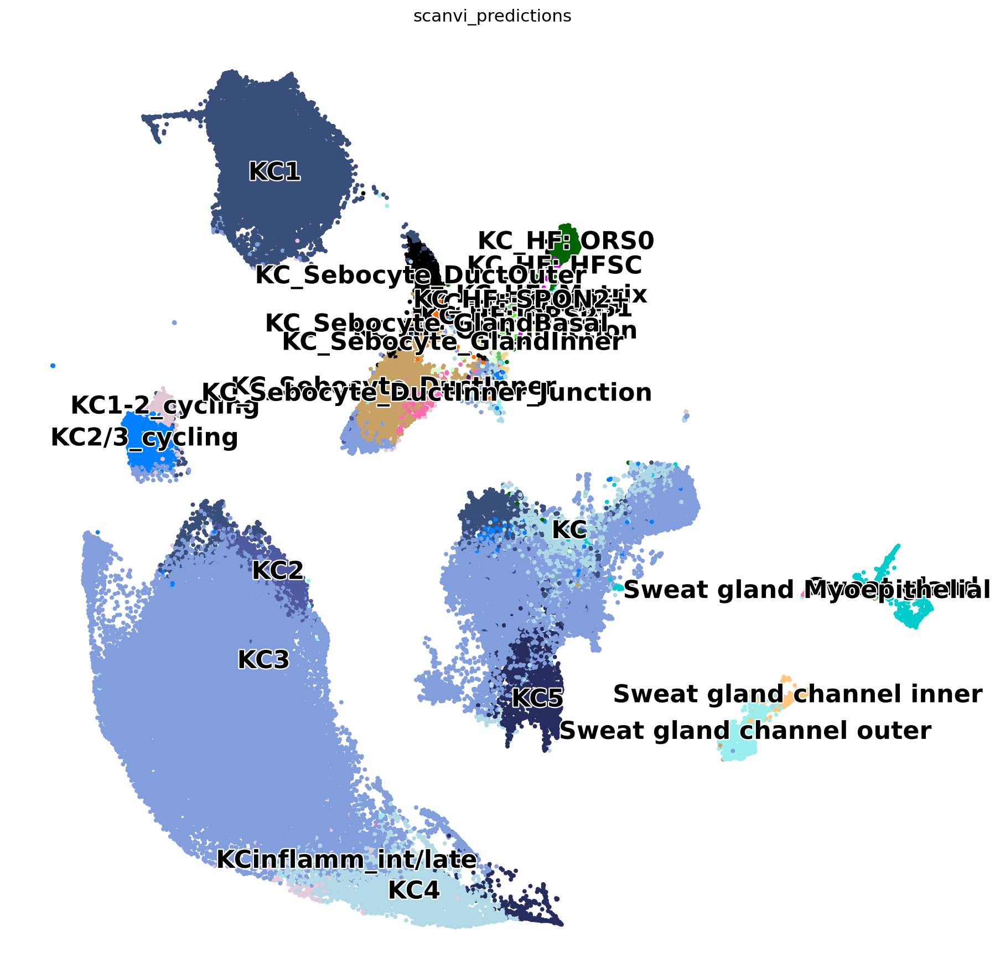

In [63]:
NEIGHBOR=20
latent_key = "neighbor_20"
sc.pp.neighbors(adata_i, use_rep = 'X_scanvi', metric = "euclidean", n_neighbors=NEIGHBOR,key_added=f"neighbor_{NEIGHBOR}")
sc.tl.umap(adata_i, min_dist=0.1, neighbors_key =f"neighbor_{NEIGHBOR}" )
# sc.tl.leiden(adata, resolution=2, key_added="latent_leiden2", #neighbors_key= latent_key 
#              )

sc.pl.umap(
        adata_i,
        color=["scanvi_predictions"],
        legend_loc="on data",
        s=50,
        legend_fontsize=20,
        legend_fontoutline=2,
        show=True,
   palette=colors,
    #title=MODEL,
        save="KCumap.pdf"

   # groups="Plasma cell",
#     linewidth=0.1,
#     edgecolor='grey',
    
  #   palette=["#F2F2F2",   "#87CEEB",    ],

    )


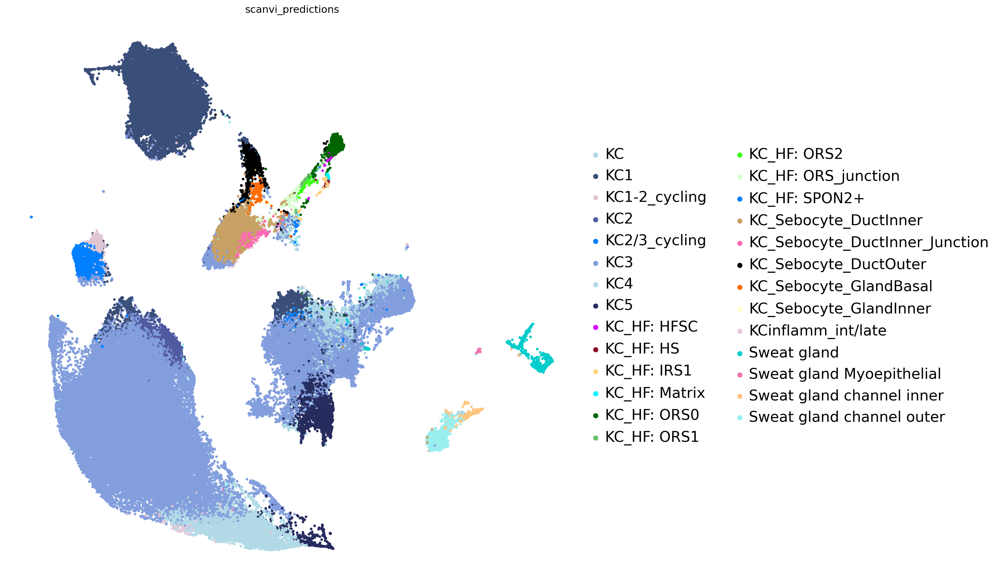

In [64]:
sc.pl.umap(
        adata_i,
        color=["scanvi_predictions"],
       # legend_loc="on data",
        s=50,
        legend_fontsize=20,
        legend_fontoutline=2,
        show=True,
   palette=colors,
    #title=MODEL,
        save="KCumap_lefend.pdf"

   # groups="Plasma cell",
#     linewidth=0.1,
#     edgecolor='grey',
    
  #   palette=["#F2F2F2",   "#87CEEB",    ],

    )


# KCs (Interfollicular)

In [65]:
adata_i = adata[(adata.obs["lvl1_new"]=="KC")#|
              # (adata.obs[CATEGORY].str.startswith("KC"))
               ]
adata_i = adata_i[~adata_i.obs[CATEGORY].str.startswith("KC_")
               ]
adata_i.shape
# adata_5k_i = adata_5k[(adata_5k.obs["lvl0"]=="KC")]


        
# #adata_5k_i = adata_5k_i[~adata_5k_i.obs[CATEGORY].str.startswith("KC")]
      
# adata_5k_i

(97277, 30977)

In [66]:

desired_order = ['KC1','KC1/2','KC1/2_cycling',"KC1-2_cycling",
 'KC2',     'KC2/3_cycling',    
    'KC3',
             'KC4',
     
           'KC5',
        'KCinflamm_basal',
 'KCinflamm_int',
                  'KCinflamm_late','KCinflamm_int/late',
 'KCinflamm_cycling',

               
 'KC_HF: Basal_LGR5+','KC_HF: Basal LGR5+',
 'KC_HF: Basal_NPNT+','KC_HF: ORS-0',
'KC_HF: ORS 1/2',
 'KC_HF: ORS/CL','KC_HF_CL', 

 'KC_HF: IRS+HS', 'KC_HF_IRS/HS', 'KC_HF: IRS',
'KC_HF: HS', 'KC_HF_cycling',
                                 'KCinflamm_Sebocyte_basal',  'KC_Sebocyte_basal','KC_Sebocyte_int',
                 'KC_Sebocyte_duct_basal/outer',
'KC_Sebocyte_PPARG+_basal/outer',
'KC*_Sebocyte',



 'KC_Sebocyte_inner','KC_Sebocyte_inner2',
'KC_Sebocyte_inner1','KC_Sebocyte_cycling','KC_Sebocyte_duct_inner',

'KC_Sebocyte_duct_outer', #'KC_Sebocyte_duct_basal/outer',
'KC_Sebocyte_PPARG+_basal',

'KC_Sebocyte_PPARG+_basal_cycling',

'KChf/cycling/ KC_Sebocyte_PPARG+_inner',
                
 'Sweat gland channel outer',    'Sweat gland channel outer_cycling',  'Sweat gland channel inner',
 'Sweat gland','KC_SC: LGR6+ACTA2+',
                 
                 
                
'KC/lowq_mastcell','KC_cycling/Mac_doublet','KC/lowq_melanocyte/T','KC*',
                 'KC_Outlier?','KC/lowq_mac_doublet','Sweat gland_plasma doublet'
,'KChf_cycling', "missing", "KC"





]

if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):
    adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].astype('category')

if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):
    adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].astype('category')

missing_data = 0
for x in list(adata_i.obs[CATEGORY].unique()):
    if x not in desired_order:
        print(x)
        missing_data +=1
if missing_data != 0:
    stop
        
        
# Set the categories in the desired order
adata_i.obs[CATEGORY] = pd.Categorical(
    adata_i.obs[CATEGORY],
    categories=desired_order,
    ordered=True
)
 

/tmp/ipykernel_3798992/269290774.py:52: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):
/tmp/ipykernel_3798992/269290774.py:53: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].astype('category')
/tmp/ipykernel_3798992/269290774.py:55: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):


In [67]:





# # Ensure 'lvl3_annotation' is categorical
# if not pd.api.types.is_categorical_dtype(adata_5k_i.obs[CATEGORY]):
#     adata_5k_i.obs[CATEGORY] = adata_5k_i.obs[CATEGORY].astype('category')

    
# if not pd.api.types.is_categorical_dtype(adata_5k_i.obs[CATEGORY]):
#     adata_5k_i.obs[CATEGORY] = adata_5k_i.obs[CATEGORY].astype('category')

# missing_data = 0
# for x in list(adata_5k_i.obs[CATEGORY].unique()):
#     if x not in desired_order:
#         print(x)
#         missing_data +=1
# if missing_data != 0:
#     stop
        
        
# # Set the categories in the desired order
# adata_5k_i.obs[CATEGORY] = pd.Categorical(
#     adata_5k_i.obs[CATEGORY],
#     categories=desired_order,
#     ordered=True
# )
 

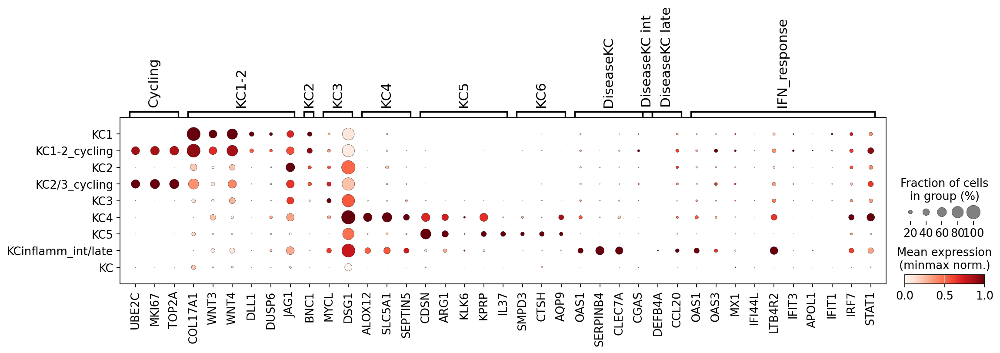

In [68]:
kc_markers={
   "Cycling": ['UBE2C', 'MKI67', "TOP2A",# "BIRC5",
                                #  "MYBL2", "TPX2"
                                  ], 'KC1-2': ['COL17A1', "KRT14",   'KRT15', "WNT3", "WNT4", 
                                        "DLL1", 'DUSP6',"DUSP10", "JAG1", "ITGB1"
                                              
                                              ],
 #   "KRT9": ["KRT9"],
 'KC2': ['BNC1', 'NOP14',         "LFNG",],
 'KC3': ['KRT1', 'KRT10', "MYCL", "DSG1"],
 'KC4': ['KRT2', 'DSC1', 'IVL', 'SPINK5', 'KLK7',  "CNFN", "ALOX12", "SLC5A1" ,"SEPTIN5", "ZNF750", "CLDN23", "TJP3"
         ],
 'KC5': ["CDSN","ARG1",'FLG',"KLK5" , "KLK6",  "KPRP", 'LOR', 'PSORS1C2', 'LCE1B', "IL37",],
     "KC6": ['SMPD3', 'CTSH',  "AQP9" ],
          
    
 'DiseaseKC': ['S100A8',
  'S100A9',
  'KRT6A',
  'KRT6B',
  'KRT6C',
  'OAS1',  'SERPINB4','AKR1B10', "CLEC7A",# "TLR3", "TLR5", 
              # "STAT1", 'STAT2', 'IRF7',
               "CGAS", 
              ],
# 'DiseaseKC basal': ['RTP4',"MX1",],
  "DiseaseKC int": [ "TCN1", "S100A12", "PLA2G3" ], 
 'DiseaseKC late': [
  'S100A7A',
  'SPRR2A',
  'GPX3',"DEFB4A", "CCL20"
 #"SERPINB11",
 ],
    "IFN_response":  ["OAS1", "OAS2", "OAS3", #"IFI27",
                      "IFI6",  "IFI44",
                "MX1", #"NMI", 
                      "XAF1", "IFI44L", "LTB4R2",
               "TRIM22", "IFIT3", "APOL1", "IFIT1",
            
               'MX2', 'IRF7', 'ISG15', 'STAT1'],
 



}

adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].astype("category").cat.remove_unused_categories()
#adata_5k_i.obs[CATEGORY] = adata_5k_i.obs[CATEGORY].astype("category").cat.remove_unused_categories()

 
sc.pl.dotplot(
    adata_i,
    remove_markers(kc_markers),
    groupby=CATEGORY,
    standard_scale="var",
    dendrogram=False,
                               colorbar_title="Mean expression\n(minmax norm.)",

      save="kc_scrna.pdf"
    
) 

# sc.pl.dotplot(adata_5k_i, 
#               remove_markers(kc_markers),
#               groupby=CATEGORY,
#               dendrogram=False, 
#                 standard_scale="var",
#                 save="kc_xenium.pdf",
#                                          colorbar_title="Mean expression\n(minmax norm.)",

#              dot_max=0.7,)
 

In [69]:
# adata_5k[adata_5k.obs[CATEGORY]=="KCinflamm_late"].obs.disease_overall.value_counts()

In [70]:
# # SLIDE_ID = adata_5k_i.obs.info_id6.value_counts().head(1).index[0]
# print(SLIDE_ID)
# adata_5k_slide = adata_5k[adata_5k.obs["info_id6"]==SLIDE_ID]
# CELL_TYPES =  adata_5k_i.obs[CATEGORY].unique()
# adata_5k_slide.obs["test"] = [x if x in CELL_TYPES  else "Other" for x in adata_5k_slide.obs[CATEGORY]]

# fallback = "#BFBFBF"

# # make column categorical (once)
# adata_5k_slide.obs["test"] = adata_5k_slide.obs["test"].astype("category")

# cat_order   = list(adata_5k_slide.obs["test"].cat.categories)
# palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
# adata_5k_slide.uns["test_colors"] = palette_vec

# sc.pl.spatial(
#     adata_5k_slide,
#     color="test",
#     spot_size=10,
#     title="",
#     #title=INFO_ID, #+ "_nonlesional",
#     legend_loc=None,
#     #legend_loc="on data",
#             edgecolor="black",
#     linewidth=0.03,
#             legend_fontsize=4,
#     save="_kc_slide.pdf"
#    # save=f"3f_{DONOR_ID}.pdf"
#     #cmap="Reds",
#            # vmax=2,




# )


In [71]:
# SLIDE_ID = adata_5k_i.obs.info_id6.value_counts().head(4).index[0]
# print(SLIDE_ID)
# adata_5k_slide = adata_5k[adata_5k.obs["info_id6"]==SLIDE_ID]
# CELL_TYPES =  adata_5k_i.obs[CATEGORY].unique()
# adata_5k_slide.obs["test"] = [x if x in CELL_TYPES  else "Other" for x in adata_5k_slide.obs[CATEGORY]]

# fallback = "#BFBFBF"

# # make column categorical (once)
# adata_5k_slide.obs["test"] = adata_5k_slide.obs["test"].astype("category")

# cat_order   = list(adata_5k_slide.obs["test"].cat.categories)
# palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
# adata_5k_slide.uns["test_colors"] = palette_vec

# sc.pl.spatial(
#     adata_5k_slide,
#     color="test",
#     spot_size=10,
#     title="",
#     #title=INFO_ID, #+ "_nonlesional",
#     legend_loc=None,
#     #legend_loc="on data",
#             edgecolor="black",
#     linewidth=0.03,
#             legend_fontsize=4,
#     save="_kc_slide.pdf"
#    # save=f"3f_{DONOR_ID}.pdf"
#     #cmap="Reds",
#            # vmax=2,




# )


# KC Appendage

In [72]:
adata.obs["lvl1_new"].value_counts()

lvl1_new
KC                             97277
Fibroblast                     70306
Endothelium/pericyte/muscle    41481
T                              27879
Myeloid                        15555
KC_HF                           8076
Other                           6383
Sweat gland                     3690
Schwann                         3151
ILC                             1036
Name: count, dtype: int64

In [73]:
adata_i = adata[(adata.obs["lvl1_new"]=="KC_HF")|
            (adata.obs["lvl1_new"]=="Sweat gland")
               ]

adata_i.obs[CATEGORY].value_counts()


lvl5_annotation
KC_Sebocyte_DuctInner             3421
KC_Sebocyte_DuctOuter             1762
Sweat gland channel outer         1558
Sweat gland                       1401
KC_HF: ORS0                       1211
Sweat gland channel inner          551
KC_HF: ORS_junction                341
KC_Sebocyte_DuctInner_Junction     296
KC_Sebocyte_GlandBasal             294
KC_HF: ORS2                        209
Sweat gland Myoepithelial          180
KC_HF: ORS1                        174
KC_HF: IRS1                        155
KC_HF: Matrix                       73
KC_HF: HFSC                         58
KC_HF: HS                           46
KC_HF: SPON2+                       31
KC_Sebocyte_GlandInner               5
Name: count, dtype: int64

In [74]:
# adata_5k_i = adata_5k[(adata_5k.obs["lvl0"]=="KC_HF")|
#             (adata_5k.obs["lvl0"]=="Sweat gland")
#                ]


# adata_5k_i.obs[CATEGORY].value_counts()



In [75]:
from collections import OrderedDict  

desired_order = [
    'KC1', 'KC1/2', 'KC1/2_cycling', 'KC1-2_cycling',
    'KC2', 'KC2/3_cycling', 'KC3', 'KC4', 'KC5',
    'KCinflamm_basal', 'KCinflamm_int', 'KCinflamm_late',
    'KCinflamm_int/late', 'KCinflamm_cycling',
    
 'KC_HF: HFSC',
    'KC_HF: Basal_LGR5+', 'KC_HF: Basal LGR5+','KC_HF: ORS-Bulb/infundibulum', 'KC_HF_SPON2',
    'KC_HF: SPON2+', 
    
    'KC_HF: Basal_NPNT+', 'KC_HF: ORS-0', 'KC_HF: ORS0',
    'KC_HF: ORS1', 'KC_HF: ORS2',   'KC_HF: ORS2i', 'KC_HF: ORS 1/2',
    'KC_HF: ORS1/2', 'KC: HF ORS1/2', 'KC_HF: ORS_cycling',
    'KC_HF: ORS/CL', 'KC_HF_CL',
     'KC_HF: ORS_junction', 
      'KC_HF: IRS0',    'KC_HF: IRS1',

    'KC_HF: IRS+HS', 'KC_HF_IRS/HS',   'KC_HF: IRS_Cuticle', 'KC_HF: IRS',
       'KC_HF: IRS_Sebo_doublet?',
    'KC_HF: IRS_cycling', 'KC_HF: Matrix', 'KC_HF: IRS_TCHH+',
    'KC_HF: HS', 'KC_HF: HS1',  'KC_HF_cycling', 'KC_HF: HS2',    'KC_HS: HS_TRPV1+',
    'KCinflamm_Sebocyte_basal', 'KC_Sebocyte_basal',
    'KC_Sebocyte_duct_basal/outer', 'KC_SebocyteDuct_Outer',
    'KC_Sebocyte_duct_outer', 'KC_SebocyteDuct_Outer-LOWQ',
    'KC*_Sebocyte',
    'KC_Sebocyte_inner', 'KC_Sebocyte_inner2',
    'KC_Sebocyte_inner1', 

      'KC_Sebocyte_DuctOuter',
      'KC_Sebocyte_DuctInner', 
    'KC_Sebocyte_duct_inner', 'KC_SebocyteDuct_Inner',
    'KC_SebocyteDuct_Outer/HF_Junction',
    'KC_SebocyteDuct_Outer/HF_junction2','KC_SebocyteDuct_Outer/HF_junction', 
 'KC_Sebocyte_DuctInner_Junction',

     'KC_Sebocyte_GlandBasal',
    'KC_Sebocyte_PPARG+_basal', 'KC_SebocyteGland_Outer','KC_SebocyteGland_outer',
    'KC_Sebocyte_PPARG+_basal_cycling',
    'KC_Sebocyte_PPARG+_basal/outer', 'KC_Sebocyte_int',
    'KChf/cycling/ KC_Sebocyte_PPARG+_inner','KC_Sebocyte_cycling',
      'KC_Sebocyte_GlandInner',
    'Sweat gland channel outer', 'Sweat gland channel cycling',
    'Sweat gland channel inner', 'Sweat gland',
    'KC_SC: LGR6+ACTA2+', 'Sweat gland Myoepithelial',
    'Sweat gland myoepithelial',
    'KC/lowq_mastcell', 'KC_cycling/Mac_doublet',
    'KC/lowq_melanocyte/T', 'KC*', 'KC_Outlier?',
    'KC/lowq_mac_doublet', 'Sweat gland_plasma doublet',
    'KChf_cycling', 'Sweat gland_cycling',
    "missing",'ASIC2+_Mechanoreceptor', 'Merkel cell',








]

# ------------------------------------------------------------------
# 2.  Remove duplicates *without* changing order
# ------------------------------------------------------------------
desired_order = list(dict.fromkeys(desired_order))  # or OrderedDict.fromkeys

# ------------------------------------------------------------------
# 3.  Ensure column is categorical
# ------------------------------------------------------------------
if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):
    adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].astype("category")

# ------------------------------------------------------------------
# 4.  Sanity-check: all data labels must be in desired_order
# ------------------------------------------------------------------
missing_labels = set(adata_i.obs[CATEGORY].unique()) - set(desired_order)
if missing_labels:
    raise ValueError(f"Labels present in data but missing from desired_order:\n{missing_labels}")

# ------------------------------------------------------------------
# 5.  Apply the ordering and drop unused categories
# ------------------------------------------------------------------
adata_i.obs[CATEGORY] = pd.Categorical(
    adata_i.obs[CATEGORY],
    categories=desired_order,
    ordered=True,
)
adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].cat.remove_unused_categories()

adata_i.obs[CATEGORY].value_counts()



/tmp/ipykernel_3798992/899363897.py:71: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):
/tmp/ipykernel_3798992/899363897.py:72: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].astype("category")


lvl5_annotation
KC_Sebocyte_DuctInner             3421
KC_Sebocyte_DuctOuter             1762
Sweat gland channel outer         1558
Sweat gland                       1401
KC_HF: ORS0                       1211
Sweat gland channel inner          551
KC_HF: ORS_junction                341
KC_Sebocyte_DuctInner_Junction     296
KC_Sebocyte_GlandBasal             294
KC_HF: ORS2                        209
Sweat gland Myoepithelial          180
KC_HF: ORS1                        174
KC_HF: IRS1                        155
KC_HF: Matrix                       73
KC_HF: HFSC                         58
KC_HF: HS                           46
KC_HF: SPON2+                       31
KC_Sebocyte_GlandInner               5
Name: count, dtype: int64

In [76]:

# from collections import OrderedDict
# desired_order = list(OrderedDict.fromkeys(desired_order))


# if not pd.api.types.is_categorical_dtype(adata_5k_i.obs[CATEGORY]):
#     adata_5k_i.obs[CATEGORY] = adata_5k_i.obs[CATEGORY].astype("category")


# missing_in_order = set(adata_5k_i.obs[CATEGORY].unique()) - set(desired_order)
# if missing_in_order:
#     print("These labels are not in desired_order:", missing_in_order)


# adata_5k_i.obs[CATEGORY] = pd.Categorical(
#     adata_5k_i.obs[CATEGORY],
#     categories=desired_order,
#     ordered=True,
# )


# adata_5k_i.obs[CATEGORY] = adata_5k_i.obs[CATEGORY].cat.remove_unused_categories()

# adata_5k_i.obs[CATEGORY].value_counts()

/software/cellgen/team298/ls34/ccc_liana/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/software/cellgen/team298/ls34/ccc_liana/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/software/cellgen/team298/ls34/ccc_liana/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


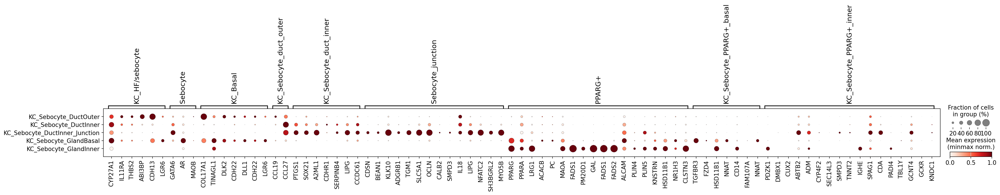

In [77]:
kc_markers={         "KC_HF/sebocyte": [ "CYP27A1",  "IL11RA", "THBS2", "ABI3BP", "CDH13", "LGR6",],
 'Sebocyte': [ "GATA6",  "EMB",   'MGST1', "AR", "MAOB",
                 #"FST", "ANGPTL2",  
                ],
 'KC_Basal': ['COL17A1',    "TINAGL1",  "DLK2",  "CDH22" , "PTN", "DLL1",  'CDH22', "LGR6", ],
 #   "KRT9": ["KRT9"],
 #'KC2': ['BNC1', 'NOP14'],
#  #'KC_Int': ['MYCL', 'ALOX12', "CDSN",],
#  'KC4': ['KRT2', 'DSC1', 'IVL', 'SPINK5', 'KLK7',  "CNFN", "ALOX12", "SLC5A1" ,"SEPTIN5", "ZNF750", "CLDN23", "TJP3"
#          ],
#  'KC5': ["CDSN","ARG1",'FLG',"KLK5" , "KLK6",  "KPRP", 'LOR', 'PSORS1C2', 'LCE1B', "IL37",],
#      "KC6": ['SMPD3', 'CTSH',  "AQP9" ],
        
    
#  # 'DiseaseKC': ['S100A8',
 #  'S100A9',
 #  'KRT6A',
 #  'KRT6B',
 #  'KRT6C',
 #  'OAS1',  'SERPINB4','AKR1B10', "CLEC7A",# "TLR3", "TLR5", 
 #              # "STAT1", 'STAT2', 'IRF7',
 #               "CGAS", 
 #              ],

 

   
         'KC_Sebocyte_duct_outer': ["CCL19", "CCL27",#"CCL22",
                 #"VCAM1", "IRF1", "ITGB1", 
                                   ],
    
     'KC_Sebocyte_duct_inner': ['PTGS1', "SOX21", "A2ML1", "CDHR1", #"GATA6",
                                "SERPINB4", "LIPG", "CCDC61",  ],
            "Sebocyte_junction": ["CDSN", "BEAN1","KLK10", "ADGRB1", "TGM1", "SLC5A1", "OCLN", "CALB2",
                # "LGALSL",
                  "SMPD3",  "IL18","LIPG", "NFATC2", #"SERPINA3", 
                  "SH3BGRL2",
                 "MYO5B"],
# 'KC_Sebocyte_duct_outer_cycling': [''],
 #'KC_Sebocyte_duct_outer_inflamm': ['CFB', "VCAM1", "ADAM8", "JAK3", "MX1", "CXCR4", "CIITA", "STAT5A"],
            "PPARG+": [ 'PPARG',  "PPARA", "LRG1", "ACACB", "PC", 
                             "MAOA", "FADS1", "PM20D1",'GAL',  "FADS1", "FADS2", 'ALCAM',"PLIN4",
                      "PLIN5",  "KNSTRN", "HSD11B1",  "NR1H3", "CLSTN3",
                      ],
     'KC_Sebocyte_PPARG+_basal': [    "TGFBR3", "FZD4", "HSD11B1" ,  "NNAT", "CD14", "FAM107A",  "NNAT",],
 'KC_Sebocyte_PPARG+_inner': [  "PDZK1",  "DMBX1",
                              "CUX2", "ABTB2", "ADM", "CYP4F2", "SEC14L3", "SMPD3", "TNNT2",
                            "IGHE", "SPAG1", "CDA", "PADI4", "TBL1Y", "GCNT4", "GCKR", "KNDC1"
                             ],
#      'Channel_general': [ 'RUNX3', 'CCN3', "MYLPF", #"FGF7"
#                         ],
        
    

 #"Gland": [ ],
#     "KC*": ['ZNF581', 'HILPDA', 'ANG', "DIABLO"],
               
#    # "Merkel": ["ATOH1", "KRT20"],
#   #  "ADIPO:": ["CEACAM1", "ADIPOQ", "CD36"]
#     "Cycling": ['UBE2C', 'MKI67', "TOP2A",# "BIRC5",
#                                 #  "MYBL2", "TPX2"
#                                   ], 
    
#     "IFN_RESPONSE":  ["OAS1", "OAS2", "OAS3", #"IFI27",
#                       "IFI6",  "IFI44",
#                 "MX1", #"NMI", 
#                       "XAF1", "IFI44L", "LTB4R2",
#                "TRIM22", "IFIT3", "APOL1", "IFIT1",
            
#                ] ,
}

adata_ii=adata_i[(adata_i.obs[CATEGORY].str.startswith("KC_S"))|
                (adata_i.obs[CATEGORY].str.startswith("KCinflamm_S"))
                 #(adata_i.obs[CATEGORY].str.startswith("KChf"))
                ]
sc.pl.dotplot(
    adata_ii,
    remove_markers(kc_markers),
    groupby=CATEGORY,
    standard_scale="var",
    dendrogram=False,
                           colorbar_title="Mean expression\n(minmax norm.)",

        save="sebocyte_scrna_healthyskin.pdf",
    #vmax=1,
#     categories_order=['KC_Sebocyte_duct_basal/outer', 'KC_Sebocyte_duct_inner',
#  'KC_Sebocyte_PPARG+_basal/outer',
#  'KC_Sebocyte_PPARG+_basal_cycling',
# ]
) 

# adata_5k_ii=adata_5k_i[(adata_5k_i.obs[CATEGORY].str.startswith("KC_Se"))]
# sc.pl.dotplot(adata_5k_ii, 
#               remove_markers(kc_markers),
#               groupby=CATEGORY,
#               dendrogram=False, 
#                 standard_scale="var",
#              dot_max=0.7,
#            colorbar_title="Mean expression\n(minmax norm.)",

#               save="sebocyte_xenium.pdf",
# #              categories_order = [  'KC_Sebocyte_duct_basal/outer', #'KC_Sebocyte_duct_outer_inflamm',
# #  #'KC_Sebocyte_duct_outer_cycling',
# #                                  'KC_Sebocyte_duct_inner',
# #  'KC_Sebocyte_PPARG+_basal/outer',
# #  'KC_Sebocyte_PPARG+_inner',
# # ]
             
#              )

# # sc.pl.dotplot(
# #     adata_ii,
# #     kc_markers,
# #     groupby=CATEGORY,
# #     standard_scale="var",
# #     dendrogram=False,
# #     #vmax=1,
# # #     categories_order=['KC_Sebocyte_duct_basal/outer', 'KC_Sebocyte_duct_inner',
# # #  'KC_Sebocyte_PPARG+_basal/outer',
# #  #'KC_Sebocyte_PPARG+_basal_cycling',
# # # ]
# # ) 

In [78]:
# SLIDE_ID = adata_5k_ii.obs.info_id6.value_counts().head(3).index[2]
# print(SLIDE_ID)
# adata_5k_slide = adata_5k[adata_5k.obs["info_id6"]==SLIDE_ID]
# CELL_TYPES =  adata_5k_i.obs[CATEGORY].unique()
# adata_5k_slide.obs["test"] = [x if x in CELL_TYPES  else "Other" for x in adata_5k_slide.obs[CATEGORY]]

# fallback = "#BFBFBF"

# # make column categorical (once)
# adata_5k_slide.obs["test"] = adata_5k_slide.obs["test"].astype("category")

# cat_order   = list(adata_5k_slide.obs["test"].cat.categories)
# palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
# adata_5k_slide.uns["test_colors"] = palette_vec

# sc.pl.spatial(
#     adata_5k_slide,
#     color="test",
#     spot_size=12,
#     title="",
#     #title=INFO_ID, #+ "_nonlesional",
#     legend_loc=None,
#     #legend_loc="on data",
#             edgecolor="black",
#     linewidth=0.05,
#             legend_fontsize=4,
#     save="_kcsebo_slide.pdf"
#    # save=f"3f_{DONOR_ID}.pdf"
#     #cmap="Reds",
#            # vmax=2,




# )


# kc_hf

/software/cellgen/team298/ls34/ccc_liana/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/software/cellgen/team298/ls34/ccc_liana/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/software/cellgen/team298/ls34/ccc_liana/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


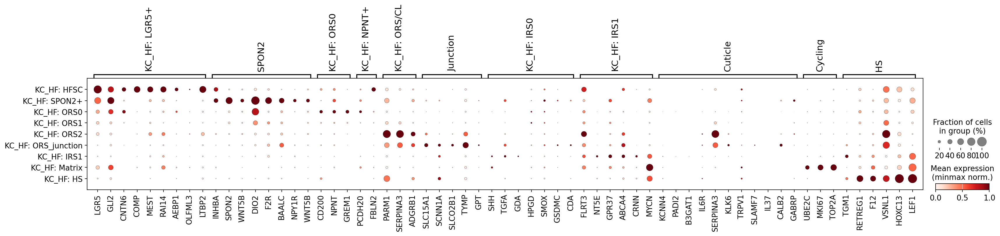

In [79]:
ORDER=[  'KC_HF: HFSC', 'KC_HF: SPON2+',
       'KC_HF: ORS0',
 'KC_HF: ORS1',
 'KC_HF: ORS2',
       
 'KC_HF: ORS_junction','KC_HF: ORS_cycling',
      





      
       'KC_HF: IRS0',
 'KC_HF: IRS1',
 'KC_HF: IRS_Cuticle', 'KC_HF: HS', 'KC_HF: Matrix', 
      ]
def remove_markers(LIST):
    try: 
        LIST = {key: [gene for gene in genes if gene in adata_5k.var_names] 
                           for key, genes in LIST.items()}
    except: 
        LIST =[gene for gene in LIST if gene in adata_5k.var_names]
    return LIST
kc_markers={
#  'KC1-2': ['COL17A1',  ],
#  #   "KRT9": ["KRT9"],
#  # #'KC2': ['BNC1', 'NOP14'],
#  # 'KC3': ['KRT1', 'KRT10', "MYCL", "DSG1"],
#  # 'KC4': ['KRT2', 'DSC1', 'IVL', 'SPINK5', 'KLK7',  "CNFN", "ALOX12", "SLC5A1" ,"SEPTIN5", "ZNF750", "CLDN23", "TJP3"
#  #         ],
#  # 'KC5': ["CDSN","ARG1",'FLG',"KLK5" , "KLK6",  "KPRP", 'LOR', 'PSORS1C2', 'LCE1B', "IL37",],
         
    

   
#             "KC_HF/sebocyte": [ "CYP27A1",  "IL11RA", "THBS2", "ABI3BP", "CDH13", "LGR6",],
#          "KC_HF": ["LHX2", "RARRES2", "KRT15",],

         
     'KC_HF: LGR5+': ['LGR5', 'GLI2', "CNTN6",'IL31RA',
                             "COMP", "MEST", "RAI14", "AEBP1", "OLFML3", "LTBP2", "ACTA2"
                             ],
    
        "SPON2":  [  'INHBA', "SPON2", "IGFBP5", "WNT5B", "DIO2", "F2R", "BAALC","NPY1R",#"EDIL3", 
                  'WNT5B', 'FOXI3', 'FBN3', 'MBOAT1'
                   
                  
                  ],
        'KC_HF: ORS0': [ "CD200", 'NPNT',  "GREM1", ],
    
                "KC_HF: NPNT+": ['PCDH20', #'SERPINF1', 
                                 'FBLN2',
                                 #"WIF1"
                                ],


            
 'KC_HF: ORS/CL': ['KRT75', 'PARM1', "CBLN2", "SERPINA3", "ADGRB1"],
   #      "KC6": ['SMPD3', 'CTSH',  "AQP9" ],
        "Junction": ["SLC15A1", "SCNN1A", #"GATA6",
                     "SLCO2B1", "TYMP", "GPT"],

#      'KC_HF: inner': ['KRT85', 'KRT35', 'KRT25', 'PADI3', 'TCHH',  "DLX2",
#                  'MSI1',
                 

#   #'SOX11',
#                  ],
    
    'KC_HF: IRS0':    ["SHH", "TGFA", "GDA", "HPGD", "SMOX",
        "GSDMC", 
      "CDA"],
      'KC_HF: IRS1':    [ "FLRT3", "NT5E", "GPR37", "ABCA4", "CRNN",
  'MYCN',],


     
    "Cuticle":[
        "KCNN4",  "PADI2", "B3GAT1", "IL6R", 
        "SERPINA3", "KLK6", "TRPV1", "SLAMF7",
       "IL37", "CALB2", "GABRP",
        # "TGFA", "GDA", "HPGD", "SMOX",
      #  "GSDMC", 
      #  "POU5F1", "CDA"
    ],
      "Cycling": ['UBE2C', 'MKI67', "TOP2A",# "BIRC5",
                                #  "MYBL2", "TPX2"
                                  ], 
    "HS": ["TGM1", "KRT82", "KRT35", "KRT23",
          "RETREG1", "F12", "VSNL1",# "GNAI1", "REEP6","PARM1", "CD200",
           "HOXC13", "LEF1",
          ],
 

#     'Sebocyte': [ "GATA6",    'MGST1', "AR","PTN", 
#                  "FST", "ANGPTL2",],


#  'LGR6+': ['LGR6', 'PCP4', 'ACTA2', 'TAGLN', 'MYH11', 'CHRM3', #'STAC2',
#            'MPPED2',#'KCNQ5',
#           'LTBP2', #'IGFBP2', 
#            'TGFB1I1',#'MCAM',
#            'KCNMB1', 'SMOC2', 'JAM3', "CD200", "FBLN2"],

 #"Gland": [ ],
  #  "KC*": ['ZNF581', 'HILPDA', 'ANG', "DIABLO"],
               

}

adata_ii=adata_i[(adata_i.obs[CATEGORY].str.startswith("KC_HF"))|
                       (adata_i.obs[CATEGORY].str.startswith("KC_HS"))
                      
                      ]
sc.pl.dotplot(
    adata_ii,
                  remove_markers(kc_markers),
    groupby="lvl5_annotation",
    standard_scale="var",
    dendrogram=False,
    #vmax=1,
    # categories_order=ORDER,
                           colorbar_title="Mean expression\n(minmax norm.)",

                              save="HF_SCRNA_healthyskin.pdf"

# ]
) 
# adata_5k_ii=adata_5k_i[(adata_5k_i.obs[CATEGORY].str.startswith("KC_HF"))|
#                        (adata_5k_i.obs[CATEGORY].str.startswith("KC_HS"))
                      
#                       ]
# sc.pl.dotplot(adata_5k_ii, 
#               remove_markers(kc_markers),
#     groupby="lvl5_annotation",
#               dendrogram=False, 
#                 standard_scale="var",
#              dot_max=0.7,
#                                        colorbar_title="Mean expression\n(minmax norm.)",

#                                         save="HF_xenium.pdf"
 
             
#              )

 

# SWEAT GLAND

/software/cellgen/team298/ls34/ccc_liana/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/software/cellgen/team298/ls34/ccc_liana/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/software/cellgen/team298/ls34/ccc_liana/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


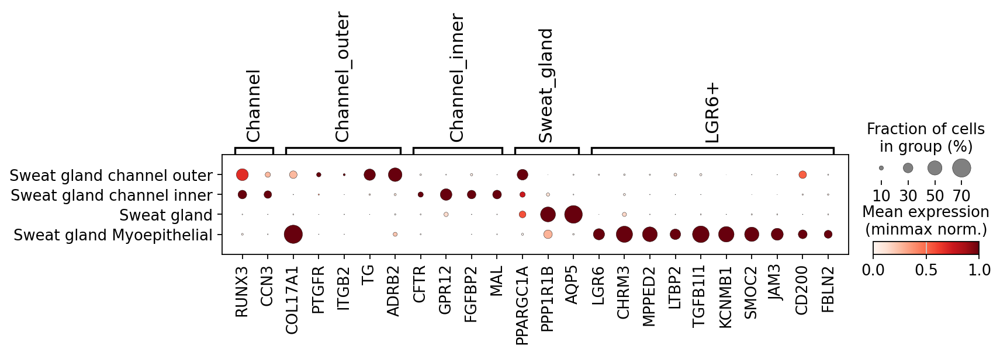

In [80]:
kc_markers={     'Channel': [ 'RUNX3', 'CCN3', "MYLPF", #"FGF7"
                        ],
        
    "Channel_outer":  ['COL17A1', "PTGFR", "ITGB2", "TG", "ADRB2"],
            "Channel_inner": [ "CFTR",  #"CRHR1",
                              "GPR12", 'FGFBP2', 'MAL', ],
    
 'Sweat_gland': ["PPARGC1A",'KRT7', 'KRT19','DCD', #"SLC12A2",
                 "PPP1R1B", "AQP5", "PIGR"], 
    
                               
 'LGR6+': ['LGR6', 'PCP4', 'ACTA2', 'TAGLN', 'MYH11', 'CHRM3', #'STAC2',
           'MPPED2',#'KCNQ5',
          'LTBP2', #'IGFBP2', 
           'TGFB1I1',#'MCAM',
           'KCNMB1', 'SMOC2', 'JAM3', "CD200", "FBLN2",  "MRGPRX3"],
    

 #"Gland": [ ],
    #"KC*": ['ZNF581', 'HILPDA', 'ANG', "DIABLO"],
               
   # "Merkel": ["ATOH1", "KRT20"],
  #  "ADIPO:": ["CEACAM1", "ADIPOQ", "CD36"]

}

adata_ii=adata_i[adata_i.obs[CATEGORY].str.startswith("Sweat")|
                adata_i.obs[CATEGORY].str.startswith("KChf")|
                                 adata_i.obs[CATEGORY].str.startswith(   'KC_SC')

              
               
               ]
sc.pl.dotplot(
    adata_ii,
              remove_markers(kc_markers),
    groupby=CATEGORY,
    standard_scale="var",
    dendrogram=False,
                               colorbar_title="Mean expression\n(minmax norm.)",

                save="sweat_scrna.pdf"

) 

# adata_5k_ii=adata_5k_i[adata_5k_i.obs[CATEGORY].str.startswith("Sweat")|
#                                                        (adata_5k_i.obs[CATEGORY].str.startswith(   'KC_SC'))
# ]

# sc.pl.dotplot(adata_5k_ii, 
#               remove_markers(kc_markers),
#               groupby=CATEGORY,
#               dendrogram=False, 
#                 standard_scale="var",
#              dot_max=0.8,
#                                          colorbar_title="Mean expression\n(minmax norm.)",

#             save="sweat_xenium.pdf"
#              )


/software/cellgen/team298/ls34/ccc_liana/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/software/cellgen/team298/ls34/ccc_liana/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/software/cellgen/team298/ls34/ccc_liana/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


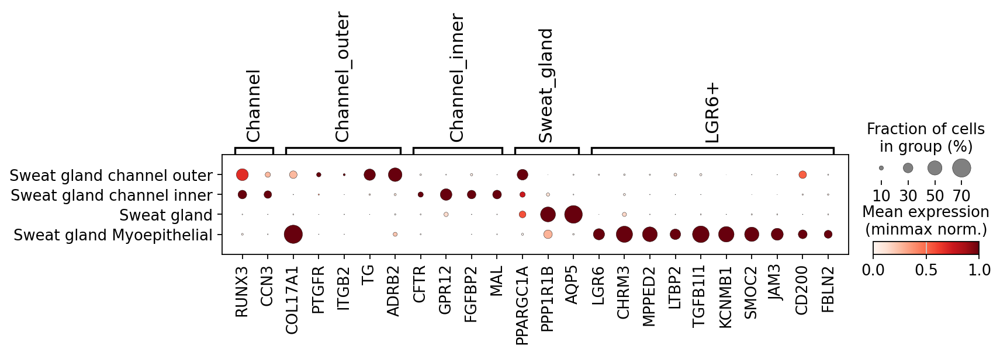

In [81]:
kc_markers={     'Channel': [ 'RUNX3', 'CCN3', "MYLPF", #"FGF7"
                        ],
        
    "Channel_outer":  ['COL17A1', "PTGFR", "ITGB2", "TG", "ADRB2"],
            "Channel_inner": [ "CFTR",  #"CRHR1",
                              "GPR12", 'FGFBP2', 'MAL', ],
    
 'Sweat_gland': ["PPARGC1A",'KRT7', 'KRT19','DCD', #"SLC12A2",
                 "PPP1R1B", "AQP5", "PIGR"], 
    
                               
 'LGR6+': ['LGR6', 'PCP4', 'ACTA2', 'TAGLN', 'MYH11', 'CHRM3', #'STAC2',
           'MPPED2',#'KCNQ5',
          'LTBP2', #'IGFBP2', 
           'TGFB1I1',#'MCAM',
           'KCNMB1', 'SMOC2', 'JAM3', "CD200", "FBLN2",  "MRGPRX3"],
    

 #"Gland": [ ],
    #"KC*": ['ZNF581', 'HILPDA', 'ANG', "DIABLO"],
               
   # "Merkel": ["ATOH1", "KRT20"],
  #  "ADIPO:": ["CEACAM1", "ADIPOQ", "CD36"]

}

adata_ii=adata_i[adata_i.obs[CATEGORY].str.startswith("Sweat")|
                adata_i.obs[CATEGORY].str.startswith("KChf")|
                                 adata_i.obs[CATEGORY].str.startswith(   'KC_SC')

              
               
               ]
sc.pl.dotplot(
    adata_ii,
              remove_markers(kc_markers),
    groupby=CATEGORY,
    standard_scale="var",
    dendrogram=False,
                               colorbar_title="Mean expression\n(minmax norm.)",

                save="sweat_scrna_healthyskin.pdf"

) 

# adata_5k_ii=adata_5k_i[adata_5k_i.obs[CATEGORY].str.startswith("Sweat")|
#                                                        (adata_5k_i.obs[CATEGORY].str.startswith(   'KC_SC'))
# ]

# sc.pl.dotplot(adata_5k_ii, 
#               remove_markers(kc_markers),
#               groupby=CATEGORY,
#               dendrogram=False, 
#                 standard_scale="var",
#              dot_max=0.8,
#                                          colorbar_title="Mean expression\n(minmax norm.)",

#             save="sweat_xenium.pdf"
#              )


In [82]:
# SLIDE_ID = adata_5k_ii.obs.info_id6.value_counts().head(1).index[0]
# print(SLIDE_ID)
# adata_5k_slide = adata_5k[adata_5k.obs["info_id6"]==SLIDE_ID]
# CELL_TYPES =  adata_5k_i.obs[CATEGORY].unique()
# adata_5k_slide.obs["test"] = [x if x in CELL_TYPES  else "Other" for x in adata_5k_slide.obs[CATEGORY]]

# fallback = "#BFBFBF"

# # make column categorical (once)
# adata_5k_slide.obs["test"] = adata_5k_slide.obs["test"].astype("category")

# cat_order   = list(adata_5k_slide.obs["test"].cat.categories)
# palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
# adata_5k_slide.uns["test_colors"] = palette_vec

# sc.pl.spatial(
#     adata_5k_slide,
#     color="test",
#     spot_size=12,
#     title="",
#     #title=INFO_ID, #+ "_nonlesional",
#     legend_loc=None,
#     #legend_loc="on data",
#             edgecolor="black",
#     linewidth=0.03,
#             legend_fontsize=4,
#     save="_kcSWEAT_slide.pdf"
#    # save=f"3f_{DONOR_ID}.pdf"
#     #cmap="Reds",
#            # vmax=2,




# )


# Combine all KC appendage

In [83]:
genes = {#'KC3': ['PTHLH', "MAOB", "FCGBP", "CD4", "CD207"],
     'Cycling': ['TOP2A', "PBK", 'MKI67',],
 
 'KC_HF: HFSC': ['ANGPTL7', "EPHB2", "LOXL2", "CA9", "COL11A1", "CD34","COMP", "THBS2"],
     'KC_HF: ORS-Bulb/infundibulum': ['SPON2', "TSPAN12", "DIO2", "FAT3", "TOX", "GLI1", ],
 'KC_HF: ORS0': ['ENPP1', "GREM1"],
 'KC_HF: ORS1': ['ADGRB1'],
 'KC_HF: ORS2': ['VTCN1',  "EPHB2",],
 'KC_HF: ORS2i': ['SMOC1', "GRP",  "VSIR"],

    'KC_HF: ORS_junction': ['PARM1', "SERPINA3", "S100A1", "CALB2", "CXCL12"],
     'KC_HF: IRS0': ['MYCN', ],
 'KC_HF: IRS1': ['KCNK2', "CRNN", "GPR37", "FZD10"],
 'KC_HF: IRS_Cuticle': ['CDSN', "LRRC15", "IL6R", "KCNN4", "AQP5", "HMOX1", "PADI2", "CST4", "IL37"],
     "KC_HF: Cuti": ["CAPN8", "TCHH", "TRPV3", "FGF22", "CDSN", "LRRC15"],
 'KC_HF: IRS_Sebo_doublet?': ['LEF1', "NRP2"],
           "KC_HF: HS": ["KRT35",  "KRT85", "LY6G6D", "KRT32", "KRT31", "TESC"], 

 'KC_HF: HS': ['CPA6',],
 'KC_HF: HS1': ['HOXC13', "RIDA", "SH3BGRL2", "CACNA1C" ,"FERMT3"],

 'KC_Sebocyte_DuctInner': ['CDHR1',],
 'KC_Sebocyte_DuctInner_Junction': ['SERPINB4', "TGM1", "TMEM45A"],
 'KC_Sebocyte_DuctOuter': ['LMO1', "IL20"],
 'KC_Sebocyte_GlandBasal': ['NNAT', "COL23A1"],
 'KC_Sebocyte_GlandInner': ['MUC1', "PLA2R1", "PLA2G7", "OAS1",
                           "PDZK1", "ROS1", "CD36", "ENTPD1", 
                            "RORC", "HSD3B1", "DMBX1", "FAM107A", "CYP4F2"
                           ],

 
        
        }
 

In [84]:
# SLIDE_ID = adata_5k_i.obs.info_id6.value_counts().head(1).index[0]
# print(SLIDE_ID)
# adata_5k_slide = adata_5k[adata_5k.obs["info_id6"]==SLIDE_ID]
# CELL_TYPES =  adata_5k_i.obs[CATEGORY].unique()
# adata_5k_slide.obs["test"] = [x if x in CELL_TYPES  else "Other" for x in adata_5k_slide.obs[CATEGORY]]

# fallback = "#BFBFBF"

# # make column categorical (once)
# adata_5k_slide.obs["test"] = adata_5k_slide.obs["test"].astype("category")

# cat_order   = list(adata_5k_slide.obs["test"].cat.categories)
# palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
# adata_5k_slide.uns["test_colors"] = palette_vec

# sc.pl.spatial(
#     adata_5k_slide,
#     color="test",
#     spot_size=8,
#     title="",
#     #title=INFO_ID, #+ "_nonlesional",
#     #legend_loc=None,
#     # legend_loc="on data",
#             edgecolor="black",
#     linewidth=0.02,
#             legend_fontsize=4,
#         save=f"_HF_slide.pdf"

#    # save=f"3f_{DONOR_ID}.pdf"
#     #cmap="Reds",
#            # vmax=2,




# )


# KC_HF+sebaceous (no sweat gland)

In [85]:
adata_i=adata_i[~adata_i.obs[CATEGORY].str.startswith("Swea")]
#adata_5k_i=adata_5k_i[~adata_5k_i.obs[CATEGORY].str.startswith("Swea")]

In [86]:
ORDER_HF = [ 'KC_HF: ORS_cycling', 
            'KC_HF: HFSC',
             'KC_HF: ORS-Bulb/infundibulum',
 'KC_HF: ORS0',
 'KC_HF: ORS1',
 'KC_HF: ORS2',# 'KC_HF: ORS2i',
 'KC_HF: ORS_junction',
             'KC_HF: IRS0',             'KC_HF: IRS_cycling',

 'KC_HF: IRS1',
 'KC_HF: IRS_Cuticle',
 'KC_HF: HS',#'KC_HF: HS1',

 'KC_Sebocyte_DuctOuter',
 'KC_Sebocyte_DuctInner',
 'KC_Sebocyte_DuctInner_Junction',

 'KC_Sebocyte_GlandBasal',
 'KC_Sebocyte_GlandInner']

In [87]:
genes = {#'KC3': ['PTHLH', "MAOB", "FCGBP", "CD4", "CD207"],
     'Cycling': ['TOP2A', "PBK", 'MKI67',],
     "KC_HF": ["LHX2", "RARRES2", "GLI1"],
 
 'KC_HF: HFSC': ['ANGPTL7', "EPHB2", "LOXL2", "CA9", "COL11A1", "CD34","COMP", "THBS2", "LTBP2",
                ],
     'KC_HF: ORS-Bulb/infundibulum': ['SPON2', "TSPAN12", "DIO2",  ],
 'KC_HF: ORS0': ['ENPP1', "GREM1"],
# 'KC_HF: ORS1': ['ADGRB1'],
        'KC_HF: ORS1-2': ['PARM1', "SERPINA3", "S100A1", "VSIR" ],
 'KC_HF: ORS2': [  "EPHB2", 'CBLN2',  'ADGRB1', "CXCL12",'VTCN1','SMOC1', "GRP", ],
        'KC_HF: ORS_junction': ["CALB2",],

     'KC_HF: IRS0': ["KRT85", "KRT25",'LEF1', 'MYCN', ],
 'KC_HF: IRS1': ['KCNK2', "CRNN", "GPR37", "FZD10", "PADI3", "TCHH"],
 'KC_HF: IRS_Cuticle': ['CDSN',"KRT23", "LRRC15", "IL6R", "KCNN4", "AQP5", "HMOX1", "PADI2", "CST4", "IL37", "TGM6",
                        "CAPN8", "TRPV3", "FGF22",  ],
# 'KC_HF: IRS_Sebo_doublet?': [ "NRP2"],
           "KC_HF: HS": ["KRT35", "LY6G6D", "KRT32", "KRT31", "TESC",
                         'CPA6', 'HOXC13', "RIDA", "SH3BGRL2", "CACNA1C" ,"FERMT3",
                         "WNT10A"],

 # 'KC_Sebocyte_DuctInner': ['CDHR1',],
 # 'KC_Sebocyte_DuctInner_Junction': ['SERPINB4', "TGM1", "TMEM45A"],
 # 'KC_Sebocyte_DuctOuter': ['LMO1', "IL20"],
 # 'KC_Sebocyte_GlandBasal': ['NNAT', "COL23A1"],
 # 'KC_Sebocyte_GlandInner': ['MUC1', "PLA2R1", "PLA2G7", "OAS1",
 #                           "PDZK1", "ROS1", "CD36", "ENTPD1", 
 #                            "RORC", "HSD3B1", "DMBX1", "FAM107A", "CYP4F2"
 #                           ],

 
        
        }
 

# vascular

In [88]:
adata_i = adata[(adata.obs["lvl0"]=='Endothelium+pericyte+muscle')|
                (adata.obs["lvl1_new"]=="Endothelium/pericyte/muscle")|
                (adata.obs[CATEGORY]=="Smooth muscle")|
                (adata.obs[CATEGORY]=="Skeletal muscle")|
                (adata.obs[CATEGORY]=="Satellite muscle")|
                (adata.obs["lvl0"]=="VE/Pericyte/muscle")
              
               
               ]
adata_i.shape

# adata_5k_i = adata_5k[(adata_5k.obs["lvl0"]=='Vascular endothelium')|
#                 (adata_5k.obs["lvl0"]=="Lymphatic endothelium")|
#                 (adata_5k.obs["lvl0"]=="Muscle")|
#                       (adata_5k.obs[CATEGORY].str.startswith("Pericyte"))|
#                                             (adata_5k.obs["lvl0"]=="VE/Pericyte/muscle")
                     
#                      ]
#                # (adata.obs[CATEGORY]=="Satellite muscle")]
# adata_i.obs[CATEGORY].value_counts()

(41481, 30977)

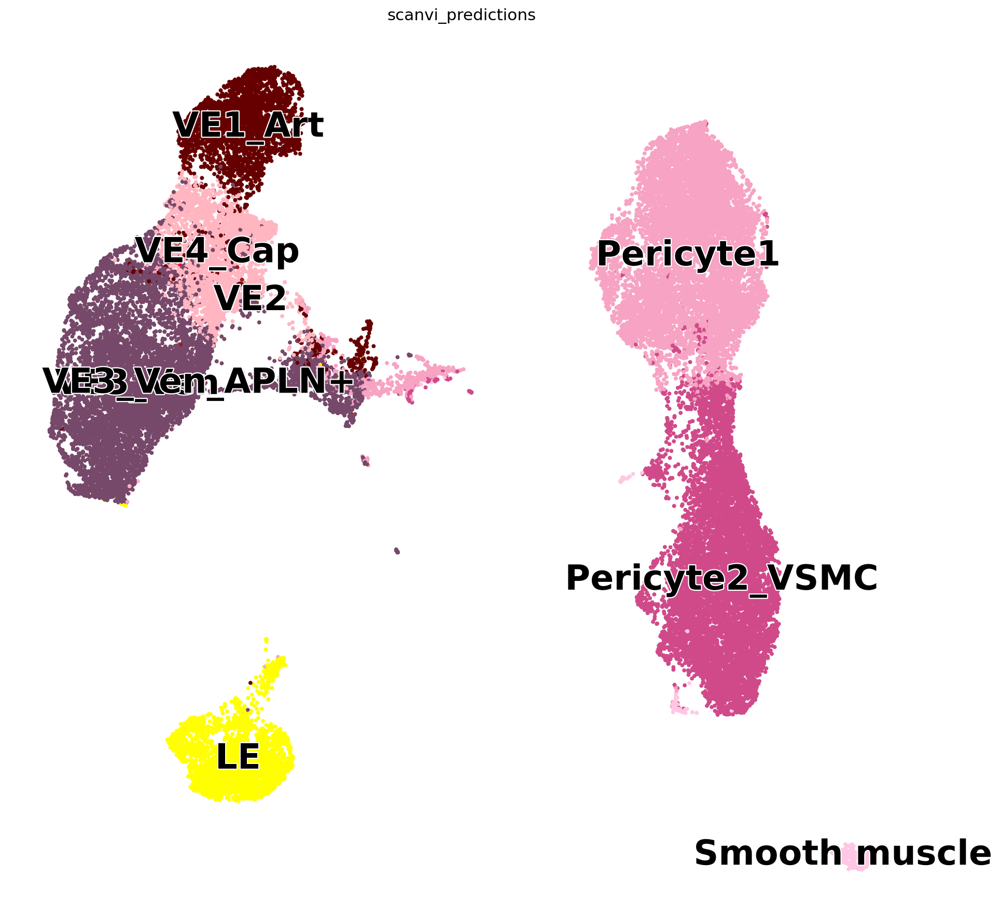

In [89]:
NEIGHBOR=20
latent_key = "neighbor_20"
sc.pp.neighbors(adata_i, use_rep = 'X_scanvi', metric = "euclidean", n_neighbors=NEIGHBOR,key_added=f"neighbor_{NEIGHBOR}")
sc.tl.umap(adata_i, min_dist=0.1, neighbors_key =f"neighbor_{NEIGHBOR}" )
# sc.tl.leiden(adata, resolution=2, key_added="latent_leiden2", #neighbors_key= latent_key 
#              )

sc.pl.umap(
        adata_i,
        color=["scanvi_predictions"],
        legend_loc="on data",
        s=50,
        legend_fontsize=30,
        legend_fontoutline=2,
        show=True,
   palette=colors,
   # title=MODEL,
        save="VEumap.pdf"

   # groups="Plasma cell",
#     linewidth=0.1,
#     edgecolor='grey',
    
  #   palette=["#F2F2F2",   "#87CEEB",    ],

    )


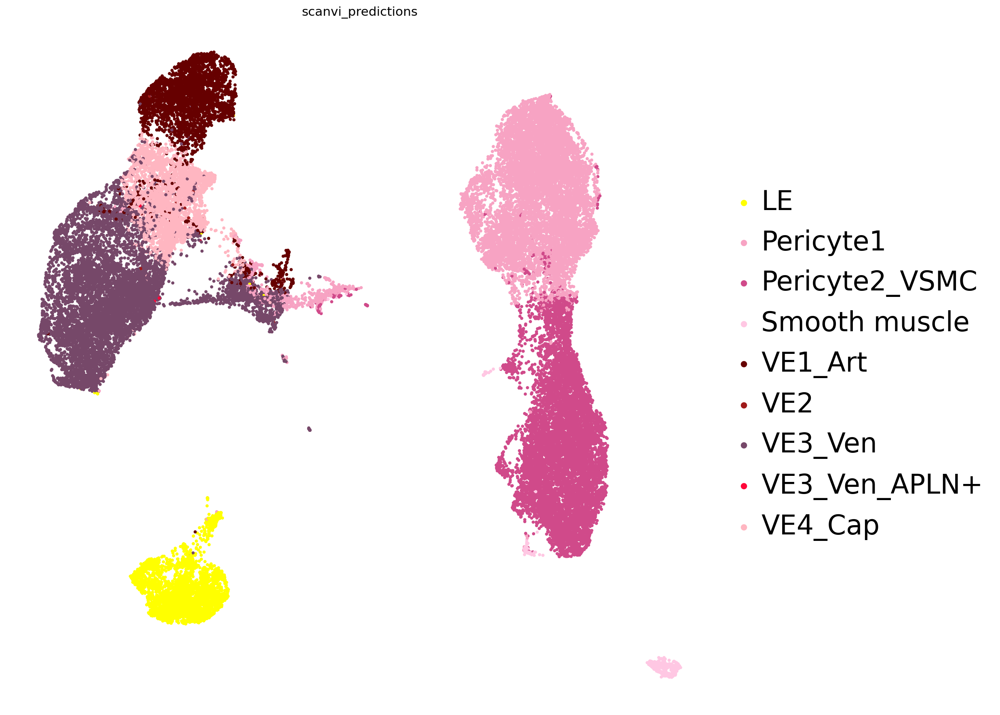

In [90]:
sc.pl.umap(
        adata_i,
        color=["scanvi_predictions"],
        #legend_loc="on data",
        s=50,
        legend_fontsize=30,
        legend_fontoutline=2,
        show=True,
   palette=colors,
   # title=MODEL,
        save="VEumap_legend.pdf"

   # groups="Plasma cell",
#     linewidth=0.1,
#     edgecolor='grey',
    
  #   palette=["#F2F2F2",   "#87CEEB",    ],

    )


In [91]:

# ------------------------------------------------------------------
# 1.  Desired order (drop duplicates without shuffling)
# ------------------------------------------------------------------
desired_order = list(OrderedDict.fromkeys([
    'Pericyte1_CCL19+', 'Pericyte1',
    'Pericyte2_CASQ2+', 'Pericyte2 (VSMC)', 'Pericyte2_VSMC',
    'Smooth muscle',
    'VE1_ADAMTS6_Art', 'VE1_Art', 'VE1_HEY1_art',
    'VE2', 'VE3_SELPhi_CCL23+', 'VE3_SELPhi_venule', 'VE3_Ven',
    'VE3_SELPhi', 'VE3_APLNhi', 'VE3_APLNhi_prolif', 'VE3_Prolif_APLN+', 'VE4_Cap_APLN+',
    'VE3_SELP_CD36+PPARG+', 'VE3_Ven_APLN+',
    'VE4_Cap', 'VE4_cap_CA4', 'VE4_Cap_CA4+',
    'LE1', 'LE',
    'Skeletal muscle', 'Satellite muscle',
    'VE*/pericyte',
    'VE3_CA4hi_cap', 'VE_lowq', 'VE_APLN_PLA1A_PTGDS/ F3 merge',
    'VE1', 'VE3_SELPhi_CD300LG', 'VE3/LE',
    'Vasc_Mural_doublet', 'VE1_GJA5hi',
    'Pericyte*', 'VE3_SELPhi_5', 'Pericyte/T doublet', 'Pericyte_LOWQ?',
    "missing"
]))

# ------------------------------------------------------------------
# 2.  Make column categorical & drop empty categories
# ------------------------------------------------------------------
adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].astype("category")
adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].cat.set_categories(desired_order, ordered=True)
adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].cat.remove_unused_categories()



In [92]:
# # ------------------------------------------------------------------
# # 2.  Make column categorical and apply ordering
# # ------------------------------------------------------------------
# adata_5k_i.obs[CATEGORY] = adata_5k_i.obs[CATEGORY].astype("category")
# adata_5k_i.obs[CATEGORY] = adata_5k_i.obs[CATEGORY].cat.set_categories(
#     desired_order, ordered=True
# )

# # ------------------------------------------------------------------
# # 3.  *Remove* zero-count categories – mandatory before plotting
# # ------------------------------------------------------------------
# adata_5k_i.obs[CATEGORY] = adata_5k_i.obs[CATEGORY].cat.remove_unused_categories()

# # sanity-check
# print(adata_5k_i.obs[CATEGORY].value_counts())
 

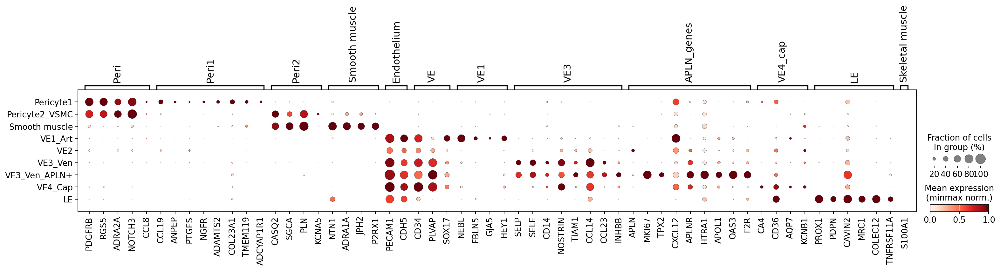

In [93]:
vasc_markers_new = {"Peri": ["PDGFRB", "RGS5", "TAGLN", "ACTA2", "ADRA2A", "NOTCH3", "CCL8"],
                    "Peri1": [ "CCL19", "ANPEP", "PTGES", "WNT6", "NGFR", "ADAMTS2", "COL23A1", "TMEM119", "ADCYAP1R1"],
                    "Peri2": ["CASQ2", "MEF2B", "MUSTN1", "MYH11", "SGCA", "USP2","PLN", "KCNA5" ,"SPEG", "NTRK3", "MYOCD", "ENTPD3", "KCNAB1", "CPED1", "ITGA8", "RERGL",
                             ],
                       
"Smooth muscle": [  "MYH11", "ACTG2", "PCP4", "ITGA8", "PRUNE2", "NTN1",
                 'ADRA1A',
  'JPH2',
 # 'FGFR2',
  #'ALDH1B1',
  #'SLMAP',
  'P2RX1',
  #'NTN1', 'MYL9', 'MFAP4', 'PCDH7'
                 ],
                    
                    
                  #  "Peri1+VE": ["ADGRF5"],
                    "Endothelium": ["PECAM1", "CDH5"],
                    "VE": ["CD34", "PLVAP", "SOX17","AQP1",],
                    "VE1": ["NEBL", "FBLN5", "SEMA3G", "GJA5", "FGF18", "PLLP", "JAG2", "KRT19", 
                            "ADAMTS6", "HEY1", #"KCNJ2", 
                            "IGFBP3", #"PTGS2"
                           ],
                    #"VE2": ["PLOD1",  "KCNJ15", "ST6GALNAC4", "TOMM34", "COL13A1"],
                    #"VE2+LE2+": ["ARG2", "GARS", "F2RL3", "TUBG2", ],
                    "VE3": [# "LRG1", "VCAM1", "SLCO2A1", 
                        "SELP", "SELE", "CD14", #"LRG1",  "CD300LG", "DSG2",
                           "ACKR1", "NOSTRIN", #"MATN2", "PCDH19", "CADM3-AS1" ,"LHX6",
                        "TIAM1", #"INHBB",
                        "CCL14",
                        "CCL23", #"IGFBP2", 
                           "RAMP3","NAV3", "VWF",     "CADM3-AS1", "INHBB", "TESC"
                    ],
                    'APLN_genes': [ "APLN", "COL13A1", "MKI67", "KIF23", "TPX2",
                                   'GPX8', 'CXCL12','CLDN11', 'KIAA1211L', "APLNR",
                                       "HTRA1", "APOL1",  # "PBK",  "PRC1",  "GGH",   
    "LHX6",
#™ "TYMS",  
  # "GOLM1", "TK1",    "DIAPH3","ANLN", 
    "ANKRD9","OAS3",
    "F2R",   "GAS2L3",   "FBLN7",
   # "MNS1", "CLN6", 
    "VSIG10",
                                   #"TYMS", "TK1", "NUSAP1", "CENPF", "PRC1", "MKI67", "ZWINT", "TPX2", "CENPM", "LMNB2", "KIF23", "MXD3", "FANCI", "PCLAF", 
               # "CCNA2",
              #"PLA1A", 
                                  ],
                    
                "VE4_cap": ["BTNL9", "CA4", "CD300LG", "CD36", "GALNT15",  "AQP7", "CLIC5","KCNB1",# "LRMP",#"SPAAR", "CHRM3", "TNMD", "PHYHIPL"
                           ],
                       "LE": ["PROX1", "TFF3", "LYVE1", "PDPN", "CAVIN2", "MRC1", "COLEC12", "TBX1", "DOCK5", "TNFRSF11A"],
                    #  "Vasc mural":  ["ACTA2", "TAGLN", "NOTCH3", "RGS5", "MCAM", "TINAGL1", "MUSTN1", "ANGPT2", "SORBS2" , "BCAM", "PDGFA", "GJA4", "PARM1", "COX4I1", "RERGL", "CDH6", "ESAM", "AOC3", "PLN","ADGRF5", 
                    #"CASQ2", "CCL8", "NGF", "MYH8", "MYH11"],
                    #"OTHER": ["HLA-DRA", "CD74"]
                    "Skeletal muscle": ["ANKRD1", "MYL1", "ENO3", "MYLPF", 'MYOZ1',
                                       'MB', 'MYBPC1', 'TNNC2', 'APOBEC2', 'TNNT3',
                                       'S100A1', 'TTN'],
  #                    'Satellite muscle': ['FGFR4',
  # 'SERPINA3',
  # 'MEST',
  # 'H19',
  # 'PAX7',
  # 'DLK1',
  # 'SIX1',
  # 'PITX2'],
  #                   "extra":["PGF", "CXCR4", "ESM1", "CYTL1"],
                   }

sc.pl.dotplot(adata_i, 
              remove_markers(vasc_markers_new),
              groupby=CATEGORY,
              dendrogram=False, 
                standard_scale="var",
                                         colorbar_title="Mean expression\n(minmax norm.)",

             save="vasc_scrna_healthyskin.pdf"
             )

# sc.pl.dotplot(adata_5k_i, 
#               remove_markers(vasc_markers_new),
#               groupby=CATEGORY,
#               dendrogram=False, 
#               dot_max=0.5,
#                                        colorbar_title="Mean expression\n(minmax norm.)",

#                 standard_scale="var",
#                save="vasc_xenium.pdf")



# # try:
# #     sc.pl.dotplot(
# #     adata_i,
# #     vasc_markers_new,
# #     groupby=CATEGORY,
# #     standard_scale="var",
# #     dendrogram=False,
# #     #swap_axes=True
# # ) 
# # except:
# #     1

In [94]:
# SLIDE_ID = adata_5k_i.obs.info_id6.value_counts().head(1).index[0]
# print(SLIDE_ID)
# adata_5k_slide = adata_5k[adata_5k.obs["info_id6"]==SLIDE_ID]
# CELL_TYPES =  adata_5k_i.obs[CATEGORY].unique()
# adata_5k_slide.obs["test"] = [x if x in CELL_TYPES  else "Other" for x in adata_5k_slide.obs[CATEGORY]]

# fallback = "#BFBFBF"

# # make column categorical (once)
# adata_5k_slide.obs["test"] = adata_5k_slide.obs["test"].astype("category")

# cat_order   = list(adata_5k_slide.obs["test"].cat.categories)
# palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
# adata_5k_slide.uns["test_colors"] = palette_vec

# sc.pl.spatial(
#     adata_5k_slide,
#     color="test",
#     spot_size=10,
#     title="",
#     #title=INFO_ID, #+ "_nonlesional",
#     legend_loc=None,
#     # legend_loc="on data",
#             edgecolor="black",
#     linewidth=0.04,
#             legend_fontsize=4,
#     save=f"_vasc_slide.pdf"
#     #cmap="Reds",
#            # vmax=2,




# )


# Fibroblasts

In [95]:
adata_i = adata[adata.obs["lvl5_annotation"].str.startswith("F")
               # (adata.obs["annotation"]=="Smooth muscle")|
                #(adata.obs["annotation"]=="Skeletal muscle")|
                #(adata.obs["annotation"]=="Satellite muscle")
               ]


adata_i.shape

# adata_5k_i = adata_5k[adata_5k.obs["lvl0"]=="Fibroblast"
#                # (adata.obs["annotation"]=="Smooth muscle")|
#                 #(adata.obs["annotation"]=="Skeletal muscle")|
#                 #(adata.obs["annotation"]=="Satellite muscle")
#                ]
# adata_5k_i.obs[CATEGORY].value_counts()

(70306, 30977)

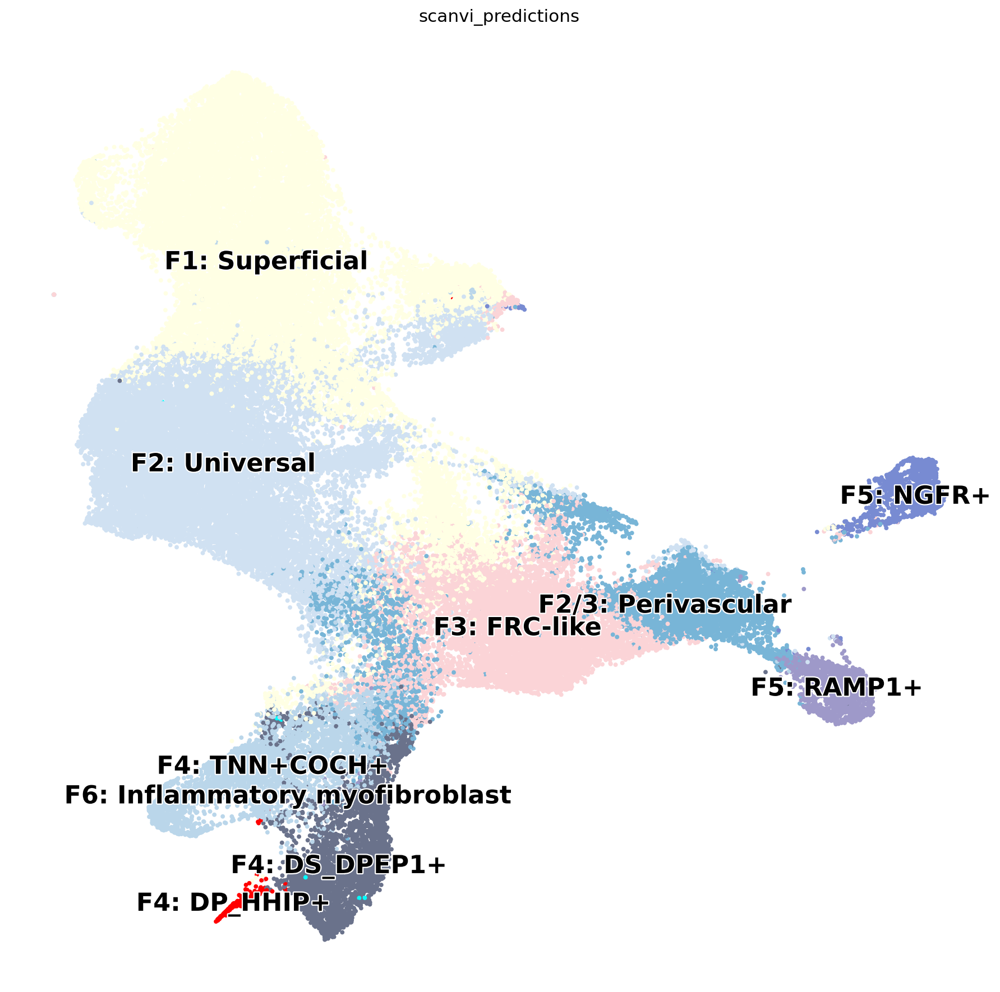

In [96]:
NEIGHBOR=20
latent_key = "neighbor_20"
sc.pp.neighbors(adata_i, use_rep = 'X_scanvi', metric = "euclidean", n_neighbors=NEIGHBOR,key_added=f"neighbor_{NEIGHBOR}")
sc.tl.umap(adata_i, min_dist=0.1, neighbors_key =f"neighbor_{NEIGHBOR}" )
# sc.tl.leiden(adata, resolution=2, key_added="latent_leiden2", #neighbors_key= latent_key 
#              )

sc.pl.umap(
        adata_i,
        color=["scanvi_predictions"],
        legend_loc="on data",
        s=50,
        legend_fontsize=20,
        legend_fontoutline=2,
        show=True,
   palette=colors,
    save="fb_umap.pdf"
   # title=MODEL,
   # groups="Plasma cell",
#     linewidth=0.1,
#     edgecolor='grey',
    
  #   palette=["#F2F2F2",   "#87CEEB",    ],

    )


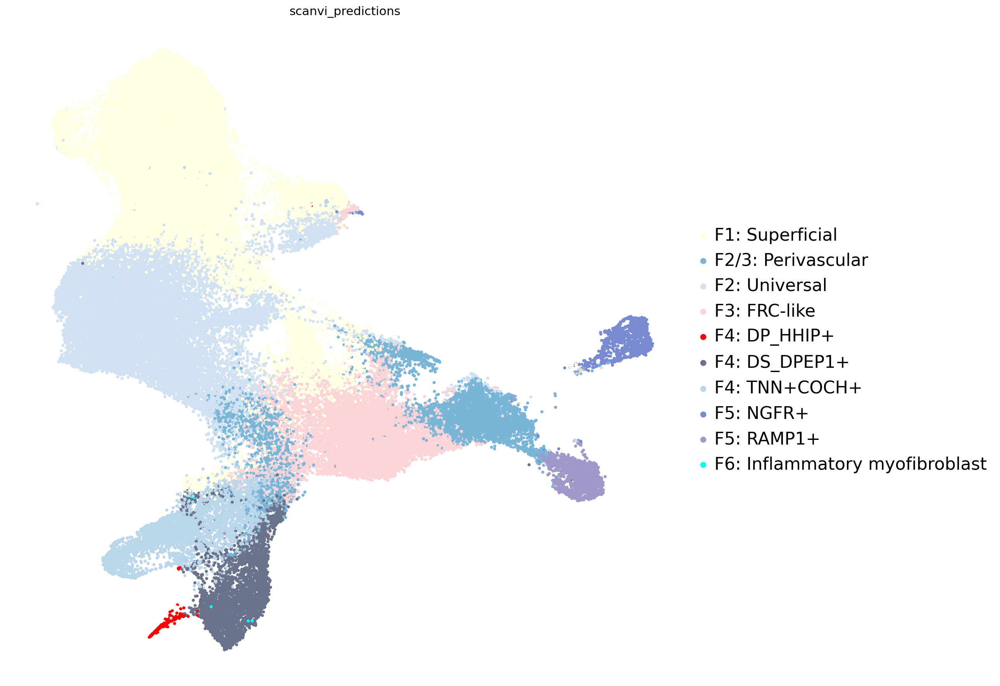

In [97]:
sc.pl.umap(
        adata_i,
        color=["scanvi_predictions"],
       # legend_loc="on data",
        s=50,
        legend_fontsize=20,
        legend_fontoutline=2,
        show=True,
   palette=colors,
        save="fb_umap_legend.pdf"

   # title=MODEL,
   # groups="Plasma cell",
#     linewidth=0.1,
#     edgecolor='grey',
    
  #   palette=["#F2F2F2",   "#87CEEB",    ],

    )


In [98]:
# adata_5k_i=adata_5k_i[~adata_5k_i.obs[CATEGORY].str.startswith("Peri")]

In [99]:
desired_order =  [ 'F1: Superficial', #'F1: Regenerative', 
                  'F2: Universal',#'F2: Universal + fascia',
 #'F2/3: Stroma_PPARG+', 
                  'F2/3: Perivascular','F3: FRC-like',






 'F4: DS_DPEP1+',
 'F4: TNN+COCH+',
 'F4: DP_HHIP+',#'FP: DP_HHIP+', 
                  'F5: RAMP1+', 'F5: NGFR+', 'F6: Inflammatory myofibroblast',

 #'F_Fascia',
                 #'lowq', "missing"
                 ]

# Ensure 'lvl3_annotation' is categorical
if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):
    adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].astype('category')

if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):
    adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].astype('category')

if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):
    adata_i.obs[CATEGORY] = adata_i.obs[CATEGORY].astype('category')

missing_data = 0
for x in list(adata_i.obs[CATEGORY].unique()):
    if x not in desired_order:
        print(x)
        missing_data +=1
if missing_data != 0:
    stop
        
        
# Set the categories in the desired order
adata_i.obs[CATEGORY] = pd.Categorical(
    adata_i.obs[CATEGORY],
    categories=desired_order,
    ordered=True
)
adata_i.obs[CATEGORY].unique()

/tmp/ipykernel_3798992/2542237488.py:21: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):
/tmp/ipykernel_3798992/2542237488.py:24: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):
/tmp/ipykernel_3798992/2542237488.py:27: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not pd.api.types.is_categorical_dtype(adata_i.obs[CATEGORY]):


['F2: Universal', 'F3: FRC-like', 'F4: DS_DPEP1+', 'F2/3: Perivascular', 'F4: TNN+COCH+', 'F1: Superficial', 'F5: NGFR+', 'F5: RAMP1+', 'F4: DP_HHIP+', 'F6: Inflammatory myofibroblast']
Categories (10, object): ['F1: Superficial' < 'F2: Universal' < 'F2/3: Perivascular' < 'F3: FRC-like' ... 'F4: DP_HHIP+' < 'F5: RAMP1+' < 'F5: NGFR+' < 'F6: Inflammatory myofibroblast']

In [100]:
desired_order = [ 'F1: Superficial',#'F1: Regenerative','F1: Superficial regenerative',

 'F2: Universal', 'F2/3: Perivascular', #'F2/3: Perivascular',
#"F2/F3",
 'F3: FRC-like',#"F3?",

#'F4',  'F4: DS_DPEP+',
 'F4: DS_DPEP1+',
 'F4: TNN+COCH+','F4: DP_HHIP+', #"F4: v nonspecific",
                 'F5: RAMP1+', 'F5: NGFR+',
 'F6: Inflammatory myofibroblast', #'F6: Inflammatory myofibroblast_prolif', 'F4/F7: Myofibroblast',
                ]

# # Ensure 'lvl3_annotation' is categorical
# if not pd.api.types.is_categorical_dtype(adata_5k_i.obs[CATEGORY]):
#     adata_5k_i.obs[CATEGORY] = adata_5k_i.obs[CATEGORY].astype('category')

    
# if not pd.api.types.is_categorical_dtype(adata_5k_i.obs[CATEGORY]):
#     adata_5k_i.obs[CATEGORY] = adata_5k_i.obs[CATEGORY].astype('category')

# missing_data = 0
# for x in list(adata_5k_i.obs[CATEGORY].unique()):
#     if x not in desired_order:
#         print(x)
#         missing_data +=1
# if missing_data != 0:
#     stop
        
        
# # Set the categories in the desired order
# adata_5k_i.obs[CATEGORY] = pd.Categorical(
#     adata_5k_i.obs[CATEGORY],
#     categories=desired_order,
#     ordered=True
# )
 

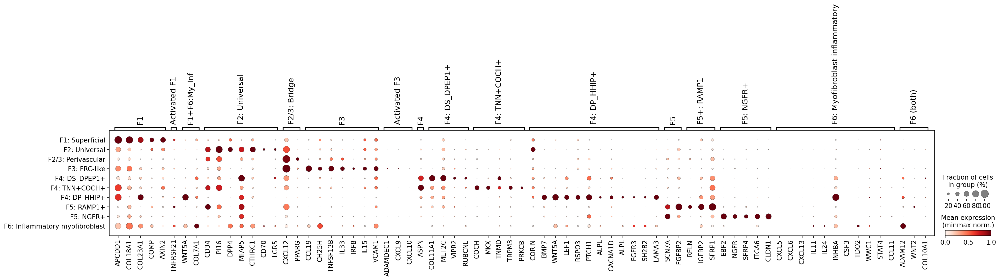

In [101]:
def remove_markers(LIST):
    try: 
        LIST = {key: [gene for gene in genes if gene in adata_5k.var_names] 
                           for key, genes in LIST.items()}
    except: 
        LIST =[gene for gene in LIST if gene in adata_5k.var_names]
    return LIST



#adata_5k.obs["lvl5_annotation_new"]=adata_5k.obs["scanvi_predictions"]
#adata_5k


FBS = {'F1': ['APCDD1',
  'COL18A1',
  'COL23A1',
  'COL13A1',
  'COMP',
  'NKD2',
  'RSPO1',
  'AXIN2',
  'WIF1',
  'SFRP2'],
                    "Activated F1": [ 'CRABP1',
  'TNFRSF21',
  'CXCL1'],
                   'F1+F6:My_Inf': ['WNT5A', 'COL7A1'],
 'F2: Universal': ['CD34',
  'PI16',
  'DPP4',
  'MFAP5',
  'PCOLCE2',
  'CTHRC1',
  'SLPI',
  'CD70',
  'LGR5'],
 'F2/3: Bridge': ['CXCL12',
  'APOE',
  'EFEMP1',
  'APOC1',
  'C7',
  'PLA2G2A',
  'PPARG',
  'MYOC',
  'GDF10'],
 'F3': ['CCL19',
  'CD74',
  'CH25H',
  'TNFSF13B',
  'IL33',
  'IRF8',
  'IL15',
  'VCAM1',
  'HLA-DRA',
  'HLA-DRB1'],
          "Activated F3": ["ADAMDEC1", "CXCL9", "CXCL10"],
 'F4': ['ASPN'],
 'F4: DS_DPEP1+': ['COL11A1', 'MEF2C', 'DPEP1', 'MYL4',  "VIPR2", "RUBCNL"],
 'F4: TNN+COCH+': ['TNN',
  'COCH',
  'CRABP1',
  'COL24A1',
  'RSPO4',
  'SLITRK6',
  'NRG3',
  'MKX',
  'TNMD',  "TRPM3", "PRKCB",],
 'F4: DP_HHIP+': ['CORIN',
  'BMP7',
  'WNT5A',
  'LEF1',
  'HHIP',
  'RSPO3',
  #'INHBA',
  'PTCH1', "ALPL", "CACNA1D", "ALPL", "TFAP2C","FGFR3", "SH2B2","LAMA3",
],
 'F5': ['SCN7A', 'FMO2', 'FGFBP2', 'OLFML2A'],
 'F5+: RAMP1': ['RAMP1', 'RELN', 'PLEKHA6', 'IGFBP2', 'SFRP1'],
 'F5: NGFR+': ['EBF2', 'NGFR', 'SFRP4', 'ITGA6', 'CDH19', 'CLDN1'],
'F6: Myofibroblast inflammatory': ['CXCL8',
  'CXCL5',
  'CXCL6',
  'CXCL13',
  'IL11',
  'IL24',
  'MMP1',
  'MMP3',
  'IL7R',
  'INHBA',
  'CSF3',
  'TDO2',
  'WWC1',
  'CHI3L1',
  'STAT4',
  'CCL5',
  'CCL3',
  'CCL11'],
 'F6 (both)': ["ADAM12",'WNT2', 'COL10A1', 'LAMP5'],
         
         }


sc.pl.dotplot(
    adata_i,
       remove_markers(FBS),
    groupby=CATEGORY,
    #vmax=1.1,
   standard_scale="var",
    dendrogram=False,
                           colorbar_title="Mean expression\n(minmax norm.)",

    save="fb_scrna_healrhtskin.pdf"
)

# sc.pl.dotplot(
#     adata_5k_i,
#     remove_markers(FBS),
#     groupby=CATEGORY,
#     #vmax=1.1,
#    standard_scale="var",
#     dendrogram=False,
#     dot_max=0.3,

#                                colorbar_title="Mean expression\n(minmax norm.)",

#       save="fb_xenium.pdf"
# ) 


# # try:
# #     sc.pl.dotplot(
# #     adata_i,
# #     FBS,
# #     groupby=CATEGORY,
# #     standard_scale="var",
# #     dendrogram=False,
# #     #swap_axes=True
# # ) 
# # except:
# #     1
 

In [102]:
# SLIDE_ID = adata_5k_i.obs.info_id6.value_counts().head(1).index[0]
# print(SLIDE_ID)
# adata_5k_slide = adata_5k[adata_5k.obs["info_id6"]==SLIDE_ID]
# CELL_TYPES =  adata_5k_i.obs[CATEGORY].unique()
# adata_5k_slide.obs["test"] = [x if x in CELL_TYPES  else "Other" for x in adata_5k_slide.obs[CATEGORY]]

# fallback = "#BFBFBF"

# # make column categorical (once)
# adata_5k_slide.obs["test"] = adata_5k_slide.obs["test"].astype("category")

# cat_order   = list(adata_5k_slide.obs["test"].cat.categories)
# palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
# adata_5k_slide.uns["test_colors"] = palette_vec

# sc.pl.spatial(
#     adata_5k_slide,
#     color="test",
#     spot_size=10,
#     title="",
#     #title=INFO_ID, #+ "_nonlesional",
#     #legend_loc=None,
#     # legend_loc="on data",
#             edgecolor="black",
#     linewidth=0.04,
#             legend_fontsize=4,
#     save="fb_slide.pdf"
#    # save=f"3f_{DONOR_ID}.pdf"
#     #cmap="Reds",
#            # vmax=2,




# )
